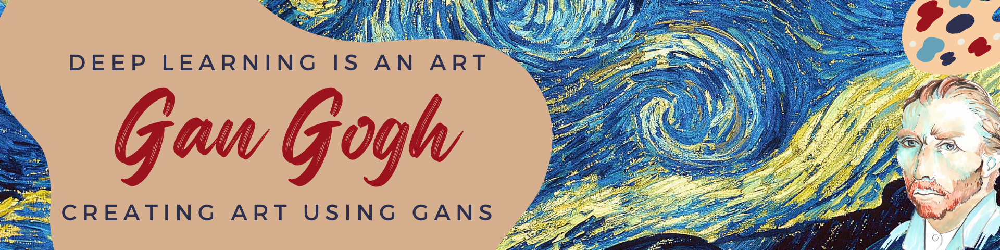

# Introduction

**Introduction**

Art has been present as long as humans have been. Cave paintings show that even the prehistoric humans also had a concept of art, which can be done to entertain and to transmit knowledge from generation to generation. Art has many forms - paintings, sculpture, literature. In this study we will explore if human beings can further the generation of art. Can neural networks, which were designed and conceptualized by humans, also learn how to make art?


**Dataset**

The dataset that was used are jpg files of Vincent Van Gogh's paintings available from https://www.kaggle.com/ipythonx/van-gogh-paintings. Only 681 items were used, which were composed of colored compositions. The handwritten drawings were removed from the dataset and only the colored pictures were retained.

**Motivation**

Van Gogh was a Dutch Post-Impressionist painter who is known for the painting 'Starry Night'.  He has produced a lot of paintings but was only able to sell one painting when he was alive. I chose Van Gogh because his paintings have personal significance to me. The painting of Van Gogh signifies my foray into independence, as this was one of the first paintings I saw when I visited Paris (alone) for the first time in 2010. From then on, I never miss the chance to visit the Musee d' Orsay every time I am in Paris to see his incredible work.

In this study, only one painter was selected to see if the neural network can learn the style of the artist and generate similar art.

**Problem Statement**

Can neural networks be used to learn and generate art?
Can GANs learn the painting style of one particular artist?


**Business Value**

All work and no play makes Jack a dull boy. Especially if Jack is an MSDS student that is so busy trying to comply with the numerous requirements. Marrying the use of neural networks and the calming practice of creating art can help an MSDS student regain some sanity. 

Moreover, artists usually experience a dry spell wherein their creative juices are not flowing. Having a seed to help as an inspiration may be the kick that they need to start the next masterpiece. The art that can be generated by the neural network can be the initial iteration/inspiration of the artist who cannot generate an idea.

# Theoretical Framework

**Generative Adversarial Networks**

Generative modeling is an unsupervised learning task in machine learning wherein patters are discovered in the data iin such a way that it can be used to generate new exaples that could plausibly be drawn from the original dataset. A General Adversarial Network (GAN) is framing the problem as a supervised learning problem with two submodels - the generator and the discriminator. The Generator model is used to generate new examples, and the Discriminator model classifies the examples as either real or fake. The two models are trained simultaneously and the goal of the generator is to fool the discriminator into classifying the generated objects as real (machinelearningmastery.com). This model was first described by Ian Goodfellow in 2014 and was standardized by Radford et. al in 2015. The equilibrium of this zero sum game is when the generator is able to generate fakes that looks as if it is coming directly from the training data, and the discriminator has 50% confience that the generator's output is real or fake. 

*Discriminator Model*: The discriminator model takes an example from the domain as input and predicts whether it is fake/generated or real. After the training process, we are no longer interested in the discriminator, we are more interested in the generator. 

According to the Pytorch DCGAN tutorial, if $x$ is the data representing the image, $D(x)$ is the discriminator network that outputs a probability that x came from the trainin data rather than the generator. Since we are dealing with images, the input to D(x) is an image of channel, height and width size of 3x64x64. Hence, $D(x)$, which is the scalar probability, should be high when $x$ comes from the training data and low when $x$ comes from the generator. 

*Generator Model*: the generator model takes a fixed-length random vector as an input and generates a sample. This vector is drawn randomly from a distribution, which is then used to seed the generative process. After training, points in this multidimensional vector space will correspond to points in the problem domain, which forms a compressed represenation of the data distribution. This vector space is the latent space. In GANs, the generator model applies meaning to points in a chosen latent space, such that new points that are drawn from the latent space can be fed to the generator model and then used to generate new and different output examples. In this study we will use the output of the generator to make new art. 

According to the Pytorch documentation, $z$ is a latent space vector sampled from a standard normal distribution. $G(z)$ represents the generator function that maps this latent vector $z$-space to the data-space. The goal of $G$ is to estimate the distribution that the training data comes from $P_{data}$ so it can generate afake samples from the estimated distribution $p_g$.

Hence, $D(G(z))$ is the probability that the output of the generator $G$ is a real image. $D$ and $G$ then play a minimax game in which $D$ tries to maximise the probability it correctly classifies the real and fakes $(logD(x))$, and $G$ tries to minimize the probability that $D$ will predict its outputs are fake $(log(1-D(G(z))))$.


The following diagram illustrates the input and output of the generator and discriminator and how they interact.

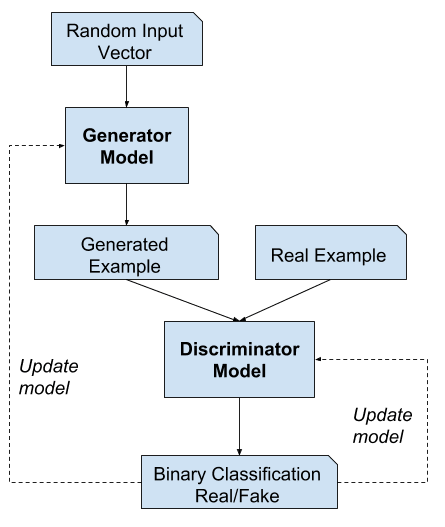

Source: https://machinelearningmastery.com/what-are-generative-adversarial-networks-gans/

**There's AI in Art?**

In 2018, Christie's auction house sold a GAN-generated painting for USD 432,000. The painting was generated by a DCGAN model which was posted in GitHub by 19-year old Robbie Barrat but marketed as art by a different party. A few years after, the advancement in computing power and models are able to create more realistic images and faces.



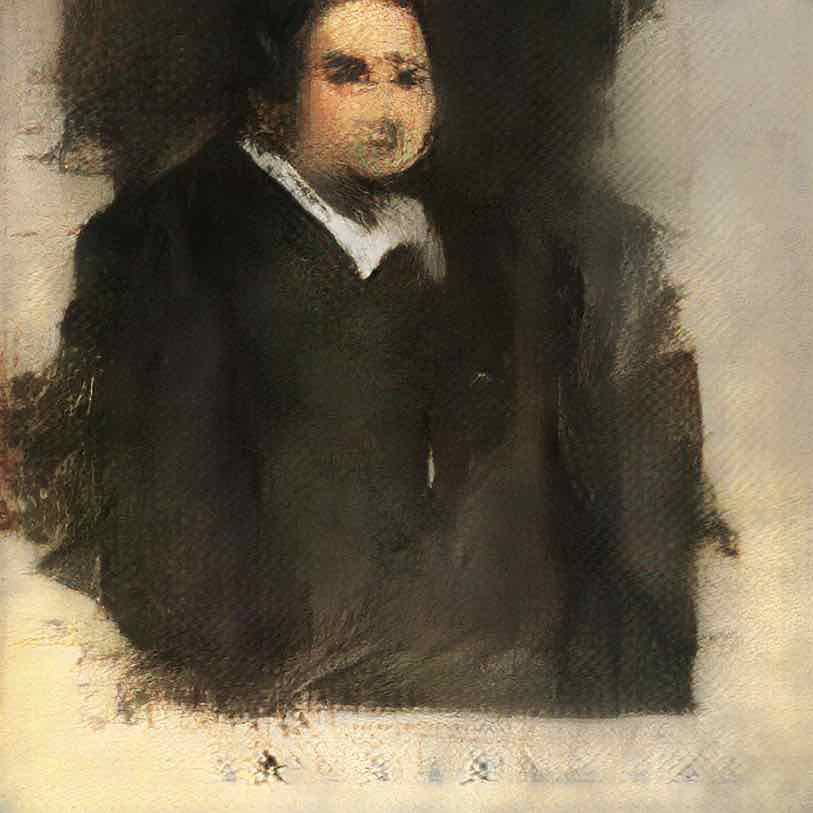

Source: https://thenextweb.com/news/someone-paid-432k-for-art-generated-by-an-open-source-neural-network

# Methodology

The following methodology was used:
1. Preprocess the jpg files so that the shape of the training input is consistent.
2. Define the discriminator model and the generator model.
3. Make the GAN model by combining the discriminator and generator models.
3. Train the model for a pre-defined number of epochs.
4. Use the generator model to generate art.

# Load the libraries

The libraries that will be used are loaded in the cell below. `Keras` was used to implement GANs. The use of keras allows the a basic implementation of GANs to show how the model works. The other libraries that will be used are  `PIL` and `Opencv` to process the images, and `glob` and `os` to process the filenames of the pictures.

In [1]:
# pip install opencv-python

In [2]:
from keras.models import Sequential
from keras.layers import Reshape
from keras.layers import Flatten
from keras.layers import Conv2D, Dense, Conv2DTranspose
from keras.layers import Dropout
from keras.layers.advanced_activations import LeakyReLU
from tensorflow.keras.optimizers import Adam

from PIL import Image
import imageio
import cv2
import glob
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

!mkdir v6
!mkdir v6/generated_images_v6

# Inspect the paintings dataset

The dataset contains 681 creations of Van Gogh. The sample painting at the bottom is `Sunflowers`,  painted in 1889. According to the Van Gogh museum, his paintings of sunflowers are among his most famous and according to the artist this communicated 'gratitude'. Van Gogh painted five large canvasses in his life, two of which were hung in the room of his friend Paul Gauguin (another prominent painter in the era) in the Yellow House.(https://www.vangoghmuseum.nl/en/collection/s0031v1962).

In [2]:
images_path = "/Users/kash/Downloads/starrynight/vangoghselect/"

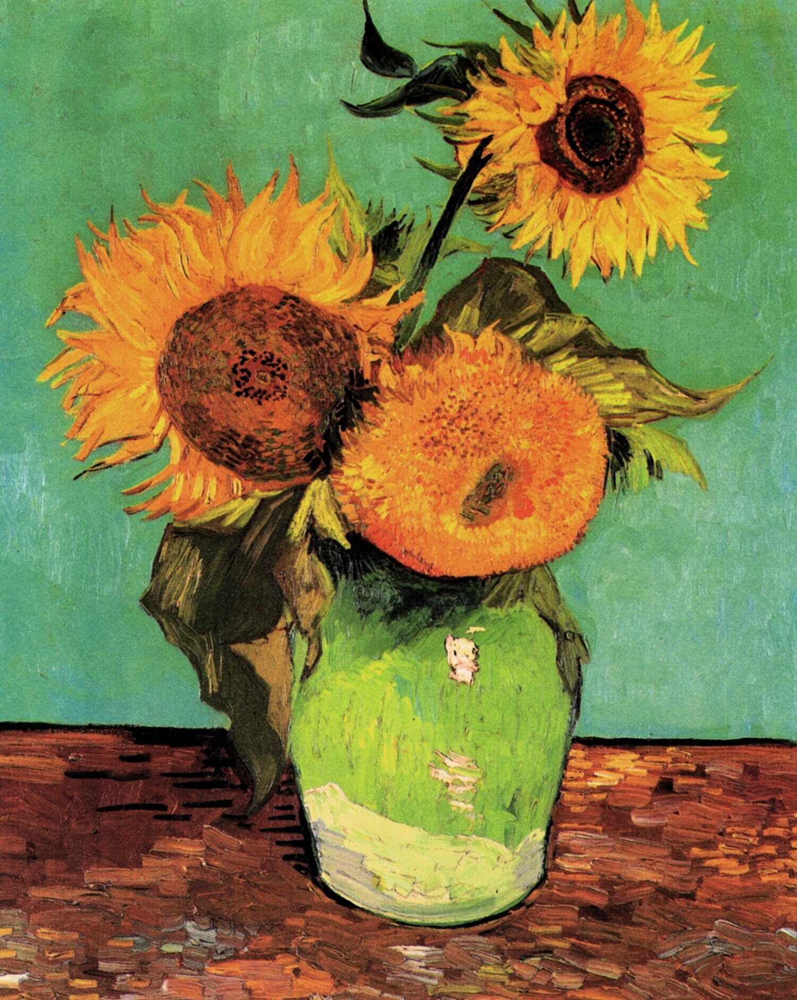

(1880, 1500, 3)

In [54]:
# for picfile in os.listdir(images_path):
#     print(picfile)

vangogh = Image.open(images_path + 'Three Sunflowers in a Vase.jpg')
display(vangogh)

# get the shape of the orig image
vg = cv2.imread(images_path + 'Three Sunflowers in a Vase.jpg')
vg.shape

It may be noted that the shape of this file is 1880 x 1500 with 3 channels. The different pictures in the training set have different pixel sizes, hence there is a need to resize it into the same shape.

# Resize the pictures

The input data was resized into a shape of 64x64. The size and shape of the paintings in the dataset were of different sizes but it needs to be in the same shape when fed to the model. It may be noted that 64x64 was derived from trial and error and was the sweet spot in terms of balancing the running time. 32x32 was too small and no details of the generated images could be seen without squinting too much, while 128x128 led to dead kernels and took too long to train. Moreover, the Pytorch implementation and other online implementations also used 64x64.

In [48]:
reshape_size = (64,64)

i = 0
for image in os.listdir(images_path):
#   print(image)
  img = cv2.imread(images_path + image)
  img = cv2.resize(img, reshape_size)
  cv2.imwrite("resized_images/%d.png" % i,img)
#   # # print(img.shape)
  i = i+1

The following shows the resized image of the *Sunflowers in a Vase* painting shown above. As can be noted in the shape, this was already resized to 64x64, with 3 channels.

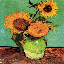

(64, 64, 3)

In [53]:
path2 = '/Users/kash/Downloads/starrynight/'
vangogh_resize = Image.open(path2 + 'resized_images/579.png')
display(vangogh_resize)

# get the shape of the resized image
vg2 = cv2.imread(path2 + 'resized_images/579.png')
vg2.shape

More samples of the resized training set are shown below. It can be seen that there is a mix of different subject in the training set. There are landscapes, still life and faces. Due to the resizing of the images, the input pictures are a bit pixelated.

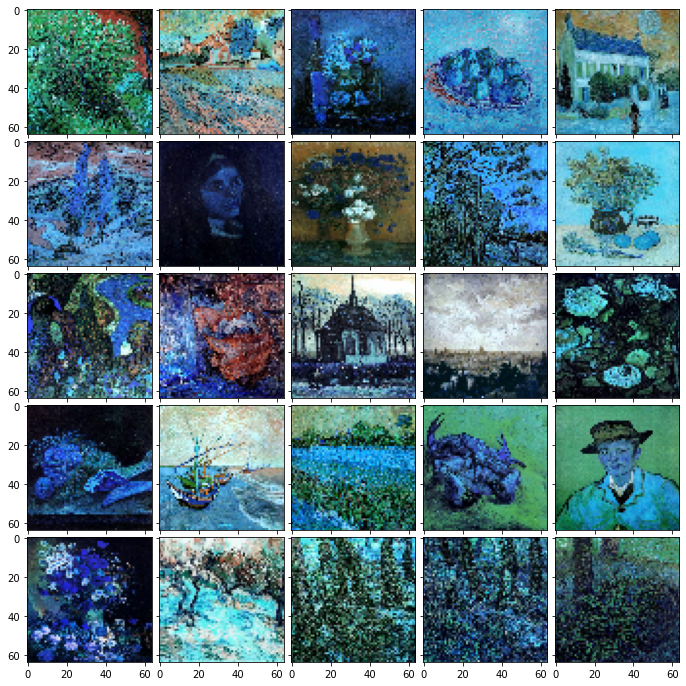

In [7]:
from mpl_toolkits.axes_grid1 import ImageGrid

# save the images as an array for printing later on

rows = 5
cols = 5
img_arr = []
start_ind = 4
end_ind = (rows*cols)+4

for r in range(start_ind, end_ind):
    path2 = '/Users/kash/Downloads/starrynight/resized_images/'
    trainpics = cv2.imread(path2 + str(r)+'.png')
    img = np.asarray(trainpics)
    img_arr.append(img)

fig = plt.figure(figsize=(12,12))
grid = ImageGrid(fig, 111, # this is the rect that will set ax position
                 nrows_ncols=(rows, cols),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes
                 )

for ax, im in zip(grid, img_arr):
    ax.imshow(im)

plt.show()

# Set the Parameters

The parameters were the image width and height, which was the same shape as the resized images. There are 3 channels since we are dealing with colored images. The latent dimension was set to be 100. This is a hyperparameter that can be tuned. Based on a recent study by Marin, Gotovac and Russo (2021, *The Effect of Latent Space Dimension on the Quality of Synthesized Human Face Images*), they found that GANs can generate images plausibly even with latent dimensions lower than the standard 100. In this study we will use `latent_dims = 100` as examples of GAN implementations and tutorials use this. Due to less computing power we opted to follow the path that was tread before us.

The optimizer that was used is `Adam` with `learning_rate = 0.0002`. This is also a tunable hyperparameter, and we also follow the typical learning rates discussed in implementations of GANs.

In [7]:
img_width = 64
img_height = 64
channels = 3
img_shape = (img_width, img_height, channels)
latent_dim = 100
adam = Adam(learning_rate=0.0002)

# Model Building





There are two models that we have to build - the generator and the discriminator. We will start with the generator. To note, it does not matter what model to build first since we will be combining these two models together when we compile the GAN model.

## Generator

The generator receives a random noise (usually Gaussian distribution) and outputs data that is often an image. The goal of the generator is to create images that fool the discriminator into classifying it as a real image.

Let us discuss some specifics in the architecture. It may be recalled that the `latent dimension` is like lower dimensionality encoding. We can think of the generator as somewhat similar to a decoder, where in it is taking some encoding size and then expanding it back out to generate an image to be fed to the decoder. The latent dimension is isually a lot less than the feature set. The original feature set is 4096 (from the pixel size of 64 x 64) so we chose 100 as the latent dimensions. This is also similar to the architectures that we have found during our research of implementations of GANs. We also use a convolutional layer with `leaky relu` as the activation function. As can be recalled, leaky relu is similar to relu but it has a smaler slope for negative values instead of a flat slope. This is an attempt to fix the 'dying ReLu' problem. The leaky relu has a very small gradient instead of zero gradient when the input is negative.

In [8]:
def build_generator():
    model = Sequential()
    model.add(Dense(256 * 8* 8, input_dim=latent_dim))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Reshape((8,8,256)))

    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Conv2D(3, (3,3), activation='tanh', padding='same'))
  
    model.summary()

    return model

generator = build_generator()

Metal device set to: Apple M1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 16384)             1654784   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 16384)             0         
                                                                 
 reshape (Reshape)           (None, 8, 8, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 16, 16, 128)      524416    
 nspose)                                                         
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 32, 32, 128)      262272    
 ranspose)                

2022-02-24 22:42:01.657310: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-02-24 22:42:01.657412: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


## Discriminator

The discriminator takes in a dataset of real images from the real data set and fake images from the generator. The model then attempts to classify it as real vs fake, and this is always a binary classification problem.

The discriminator is a sequential model that accepts the shape of the image outputted by the generator. A convolutional layer was also used since we are dealing with images. The activation function that will be used is leaky relu. The last layer is a dense layer with a sigmoid activation function because the discriminator is a classifation model which will tell if the image is real or fake. Since it is a classification model, the loss is binary crossentropy. Adam was used as the optimizer. This was chosen because adam converges faster compared to other optimzers such as SGD.

In [9]:
def build_discriminator():
    model = Sequential()
    model.add(Conv2D(64, (3,3), padding='same', input_shape=img_shape))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Conv2D(128, (3,3), padding='same', ))
    model.add(LeakyReLU(alpha=0.2))
    
    model.add(Conv2D(128, (3,3), padding='same'))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Conv2D(256, (3,3), padding='same'))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation='sigmoid'))

    model.summary()
    return model

discriminator = build_discriminator()
discriminator.compile(loss='binary_crossentropy', optimizer=adam,
                      metrics=['accuracy'])

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 64, 64, 64)        1792      
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 64, 64, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 128)       73856     
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 64, 64, 128)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 64, 64, 128)       147584    
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 64, 64, 128)       0         
                                                                 
 conv2d_4 (Conv2D)           (None, 64, 64, 256)      

## GAN

To build the GAN model we will combine the generator model and the discriminator model. The two models are trained in alternating periods. When the generator is training we have to keep the discriminator contant so that the generator will not try to hit a moving target (and hence fail to converge). Thisis why we add a  `discriminator.trainable = False`. The same is true when the discriminator is training - we have to keep the generator constant becuse it has to learn how to recognize the generator's flaws. It is noted that the discriminator itself is doing a classification of what is real and what is fake, hence the binary cross entropy loss. We are not compiling the generator because it is only  trained through the full GAN model. 

By combining the discriminator and the generator in the GAN call, the two models are trained together n alternating periods. The generator generates a batch of samples and these are added to the real samples, which are then provided to the discriminator. The discriminator will then classify these images as real or fake. The discrimator is then updated to get better at classifying real and fake samples, while the generator is updated based on how well the generated images are classified as real. 

The description above is reminiscent of a zero sum game because the two models are competing against each other. When the discriminator successfully classifies samples, it is rewarded or no change is needed to the model parameters, but the generator is penalized with large updates to its model parameters. If the reverse happens (i.e., the discriminator is not able to classify the images correctly), then the discriminator model's parameters will be updated. 

Comparing it to the tensorflow calls that we have learned in class (i.e., fit and compile the model), we have a sense of two models that are competiting against each other so we cannot use the .fit command.

In [10]:
GAN = Sequential()
discriminator.trainable = False
GAN.add(generator)
GAN.add(discriminator)

GAN.compile(loss='binary_crossentropy', optimizer=adam)

The summary of the generator, discriminator and GAN model are shown below. The generator has 2,707,203 parameters. The discriminator has 1,566,977. In total, the GAN model has 4,274,180 parameters, which is the total number of parameters of the two models.

In [11]:
generator.summary()
discriminator.summary()
GAN.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 16384)             1654784   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 16384)             0         
                                                                 
 reshape (Reshape)           (None, 8, 8, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 16, 16, 128)      524416    
 nspose)                                                         
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 32, 32, 128)      262272    
 ranspose)                                              

## Helper funtion - save the images

A helper function is defined below to save the images in a folder. The saved images from the generator will be inspected visually later to see how well the generator is able to produce images similar to the training set.

In [12]:
save_name = 0.00000000

def save_imgs(epoch):
    r, c = 2, 2
    noise = np.random.normal(0, 1, (r * c, latent_dim))
    gen_imgs = generator.predict(noise)
    global save_name
    save_name += 0.00000001

    # Rescale images 0 - 1
    gen_imgs = (gen_imgs + 1) / 2

    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i,j].imshow(gen_imgs[cnt])
            axs[i,j].axis('off')
            cnt += 1
    fig.savefig("v6/currentgeneration_v6.png")
    fig.savefig("v6/generated_images_v6/%.8f.png" % save_name)
    plt.close()

# Training the GAN

There are two phases in training. Phase 1 is training the discriminator and Phase 2 is training the generator

*Phase 1: Training the discriminator*

The real images are combined with the fake images from the generator. The discriminator model is then trained to distinguish the real images from the fake images. The backpropagation is only on the discriminator weights. 

*Phase 2: Training the generator*

Fake images are produced from the generator, with noise as the input. These fake images are fed to the generator with all labels set as real. In this way, this causes the generator to attempt to produce images that the discriminator will classify as real. Because we feed in fake images that are all labeled 1, we only perform backpropagation on the generator weights. It should also be noted that the generator model is not fed the real images. It is only able to generate convincing images based on the gradients flowing back through the discriminator.

The generator and the discriminator are trained at the same time. The discriminator is also improving as the training phases continues, which means that the generated images also need to get better to be able to fool the discriminator. 

500 epochs were used and this was arrived at from trial and error. This was the most stable epoch where the browser/notebook did not crash.

(680, 64, 64, 3)
(680, 64, 64, 3)


2022-02-24 22:42:02.120877: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2022-02-24 22:42:02.160636: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-02-24 22:42:02.405469: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-02-24 22:42:03.397617: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


******* 0 0 [D loss: 0.687378, acc: 46.88%] [G loss: 0.672535]
******* 0 1 [D loss: 0.365253, acc: 50.00%] [G loss: 0.700079]
******* 0 2 [D loss: 0.343118, acc: 93.75%] [G loss: 0.764032]
******* 0 3 [D loss: 0.300574, acc: 100.00%] [G loss: 0.909716]
******* 0 4 [D loss: 0.221280, acc: 100.00%] [G loss: 1.252908]
******* 0 5 [D loss: 0.483683, acc: 89.06%] [G loss: 1.150845]
******* 0 6 [D loss: 0.208235, acc: 100.00%] [G loss: 1.113958]
******* 0 7 [D loss: 0.236413, acc: 100.00%] [G loss: 1.091438]
******* 0 8 [D loss: 0.270564, acc: 100.00%] [G loss: 1.098944]
******* 0 9 [D loss: 0.288150, acc: 98.44%] [G loss: 1.298088]
******* 0 10 [D loss: 0.213004, acc: 100.00%] [G loss: 1.959562]
******* 0 11 [D loss: 0.046337, acc: 100.00%] [G loss: 3.718220]
******* 0 12 [D loss: 0.003146, acc: 100.00%] [G loss: 6.492030]
******* 0 13 [D loss: 0.290619, acc: 93.75%] [G loss: 5.156931]
******* 0 14 [D loss: 0.009420, acc: 100.00%] [G loss: 3.440932]
******* 0 15 [D loss: 0.102891, acc: 100.

2022-02-24 22:42:26.730289: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


******* 1 0 [D loss: 0.017036, acc: 98.44%] [G loss: 10.030956]
******* 1 1 [D loss: 0.510506, acc: 90.62%] [G loss: 11.866387]
******* 1 2 [D loss: 0.068365, acc: 98.44%] [G loss: 11.518091]
******* 1 3 [D loss: 0.000453, acc: 100.00%] [G loss: 9.627081]
******* 1 4 [D loss: 0.003091, acc: 100.00%] [G loss: 6.755683]
******* 1 5 [D loss: 0.006885, acc: 100.00%] [G loss: 3.909022]
******* 1 6 [D loss: 0.084871, acc: 100.00%] [G loss: 6.524576]
******* 1 7 [D loss: 0.000110, acc: 100.00%] [G loss: 11.677394]
******* 1 8 [D loss: 0.000020, acc: 100.00%] [G loss: 14.984326]
******* 1 9 [D loss: 0.147252, acc: 96.88%] [G loss: 14.973058]
******* 1 10 [D loss: 0.014232, acc: 98.44%] [G loss: 14.494387]
******* 1 11 [D loss: 0.053447, acc: 98.44%] [G loss: 11.735622]
******* 1 12 [D loss: 0.000081, acc: 100.00%] [G loss: 8.978848]
******* 1 13 [D loss: 0.000951, acc: 100.00%] [G loss: 6.268054]
******* 1 14 [D loss: 0.011072, acc: 100.00%] [G loss: 4.633741]
******* 1 15 [D loss: 0.025252, a

******* 7 2 [D loss: 0.888734, acc: 76.56%] [G loss: 13.155087]
******* 7 3 [D loss: 1.106266, acc: 81.25%] [G loss: 7.402521]
******* 7 4 [D loss: 0.598342, acc: 92.19%] [G loss: 8.654175]
******* 7 5 [D loss: 0.851070, acc: 87.50%] [G loss: 8.171132]
******* 7 6 [D loss: 0.134139, acc: 96.88%] [G loss: 20.188133]
******* 7 7 [D loss: 0.044660, acc: 96.88%] [G loss: 24.263638]
******* 7 8 [D loss: 0.220738, acc: 89.06%] [G loss: 29.022604]
******* 7 9 [D loss: 0.146342, acc: 93.75%] [G loss: 22.410414]
******* 7 10 [D loss: 0.481714, acc: 84.38%] [G loss: 14.246174]
******* 7 11 [D loss: 0.705781, acc: 81.25%] [G loss: 8.998875]
******* 7 12 [D loss: 0.362127, acc: 85.94%] [G loss: 16.408798]
******* 7 13 [D loss: 0.838342, acc: 87.50%] [G loss: 6.162508]
******* 7 14 [D loss: 3.704601, acc: 37.50%] [G loss: 5.315481]
******* 7 15 [D loss: 1.116849, acc: 79.69%] [G loss: 11.605175]
******* 7 16 [D loss: 0.839760, acc: 78.12%] [G loss: 11.275200]
******* 7 17 [D loss: 1.214816, acc: 85

******* 13 4 [D loss: 0.028681, acc: 100.00%] [G loss: 11.904679]
******* 13 5 [D loss: 0.157984, acc: 92.19%] [G loss: 11.175051]
******* 13 6 [D loss: 0.108053, acc: 92.19%] [G loss: 10.965604]
******* 13 7 [D loss: 0.016435, acc: 100.00%] [G loss: 11.618797]
******* 13 8 [D loss: 0.023218, acc: 98.44%] [G loss: 12.684864]
******* 13 9 [D loss: 0.024409, acc: 98.44%] [G loss: 10.961031]
******* 13 10 [D loss: 0.033836, acc: 98.44%] [G loss: 9.298832]
******* 13 11 [D loss: 0.008034, acc: 100.00%] [G loss: 8.961630]
******* 13 12 [D loss: 0.025250, acc: 98.44%] [G loss: 8.771316]
******* 13 13 [D loss: 0.004503, acc: 100.00%] [G loss: 6.454068]
******* 13 14 [D loss: 0.004699, acc: 100.00%] [G loss: 7.185601]
******* 13 15 [D loss: 0.004947, acc: 100.00%] [G loss: 6.220202]
******* 13 16 [D loss: 0.013791, acc: 100.00%] [G loss: 6.531073]
******* 13 17 [D loss: 0.015668, acc: 100.00%] [G loss: 7.953642]
******* 13 18 [D loss: 0.012925, acc: 100.00%] [G loss: 8.069990]
******* 13 19 [D

******* 19 4 [D loss: 0.169061, acc: 90.62%] [G loss: 8.555767]
******* 19 5 [D loss: 0.013121, acc: 100.00%] [G loss: 7.128017]
******* 19 6 [D loss: 0.291150, acc: 95.31%] [G loss: 8.432370]
******* 19 7 [D loss: 2.271499, acc: 73.44%] [G loss: 17.634417]
******* 19 8 [D loss: 0.136530, acc: 95.31%] [G loss: 36.509853]
******* 19 9 [D loss: 0.448606, acc: 90.62%] [G loss: 35.632851]
******* 19 10 [D loss: 1.436524, acc: 81.25%] [G loss: 34.810814]
******* 19 11 [D loss: 2.030829, acc: 76.56%] [G loss: 39.796799]
******* 19 12 [D loss: 1.035041, acc: 87.50%] [G loss: 41.179390]
******* 19 13 [D loss: 0.425852, acc: 92.19%] [G loss: 30.649891]
******* 19 14 [D loss: 0.003038, acc: 100.00%] [G loss: 27.136129]
******* 19 15 [D loss: 0.091112, acc: 96.88%] [G loss: 19.946796]
******* 19 16 [D loss: 0.305279, acc: 93.75%] [G loss: 15.705378]
******* 19 17 [D loss: 0.052786, acc: 98.44%] [G loss: 9.188107]
******* 19 18 [D loss: 0.290523, acc: 89.06%] [G loss: 11.060568]
******* 19 19 [D l

******* 25 4 [D loss: 0.022855, acc: 100.00%] [G loss: 6.611787]
******* 25 5 [D loss: 0.010590, acc: 100.00%] [G loss: 6.870651]
******* 25 6 [D loss: 0.032746, acc: 100.00%] [G loss: 6.351902]
******* 25 7 [D loss: 0.090040, acc: 95.31%] [G loss: 7.738531]
******* 25 8 [D loss: 0.048836, acc: 98.44%] [G loss: 7.452993]
******* 25 9 [D loss: 0.020436, acc: 100.00%] [G loss: 8.353924]
******* 25 10 [D loss: 0.103559, acc: 96.88%] [G loss: 8.255575]
******* 25 11 [D loss: 0.054979, acc: 98.44%] [G loss: 7.500597]
******* 25 12 [D loss: 0.006566, acc: 100.00%] [G loss: 5.875771]
******* 25 13 [D loss: 0.033132, acc: 98.44%] [G loss: 5.858367]
******* 25 14 [D loss: 0.036070, acc: 98.44%] [G loss: 6.448656]
******* 25 15 [D loss: 0.094723, acc: 96.88%] [G loss: 7.135646]
******* 25 16 [D loss: 0.066666, acc: 98.44%] [G loss: 8.052276]
******* 25 17 [D loss: 0.045038, acc: 100.00%] [G loss: 7.554656]
******* 25 18 [D loss: 0.062590, acc: 98.44%] [G loss: 7.886129]
******* 25 19 [D loss: 0.

******* 31 5 [D loss: 0.036693, acc: 100.00%] [G loss: 4.151690]
******* 31 6 [D loss: 0.094754, acc: 96.88%] [G loss: 4.111524]
******* 31 7 [D loss: 0.087969, acc: 96.88%] [G loss: 4.009007]
******* 31 8 [D loss: 0.052562, acc: 100.00%] [G loss: 3.861394]
******* 31 9 [D loss: 0.059892, acc: 98.44%] [G loss: 4.582839]
******* 31 10 [D loss: 0.021782, acc: 100.00%] [G loss: 5.312565]
******* 31 11 [D loss: 0.029187, acc: 98.44%] [G loss: 5.571305]
******* 31 12 [D loss: 0.042881, acc: 98.44%] [G loss: 5.225088]
******* 31 13 [D loss: 0.021124, acc: 100.00%] [G loss: 4.804650]
******* 31 14 [D loss: 0.043788, acc: 98.44%] [G loss: 4.376305]
******* 31 15 [D loss: 0.041506, acc: 98.44%] [G loss: 3.730471]
******* 31 16 [D loss: 0.036107, acc: 100.00%] [G loss: 3.425396]
******* 31 17 [D loss: 0.024774, acc: 100.00%] [G loss: 4.496277]
******* 31 18 [D loss: 0.033781, acc: 98.44%] [G loss: 4.731403]
******* 31 19 [D loss: 0.015719, acc: 100.00%] [G loss: 5.776807]
******* 31 20 [D loss: 

******* 37 6 [D loss: 0.521080, acc: 79.69%] [G loss: 3.275216]
******* 37 7 [D loss: 0.079760, acc: 96.88%] [G loss: 7.446487]
******* 37 8 [D loss: 0.093471, acc: 93.75%] [G loss: 7.804878]
******* 37 9 [D loss: 0.145619, acc: 96.88%] [G loss: 6.905039]
******* 37 10 [D loss: 0.605642, acc: 89.06%] [G loss: 2.696403]
******* 37 11 [D loss: 0.402528, acc: 79.69%] [G loss: 5.021839]
******* 37 12 [D loss: 0.160371, acc: 96.88%] [G loss: 8.495052]
******* 37 13 [D loss: 0.649461, acc: 84.38%] [G loss: 7.056355]
******* 37 14 [D loss: 0.298957, acc: 90.62%] [G loss: 3.552317]
******* 37 15 [D loss: 0.179195, acc: 95.31%] [G loss: 3.100237]
******* 37 16 [D loss: 0.193252, acc: 92.19%] [G loss: 3.654505]
******* 37 17 [D loss: 0.054324, acc: 98.44%] [G loss: 5.445769]
******* 37 18 [D loss: 0.100302, acc: 93.75%] [G loss: 6.147707]
******* 37 19 [D loss: 0.018909, acc: 100.00%] [G loss: 5.856405]
******* 37 20 [D loss: 0.040066, acc: 100.00%] [G loss: 5.649002]
******* 38 0 [D loss: 0.140

******* 43 7 [D loss: 0.036560, acc: 100.00%] [G loss: 5.338489]
******* 43 8 [D loss: 0.112586, acc: 96.88%] [G loss: 4.829030]
******* 43 9 [D loss: 0.115299, acc: 96.88%] [G loss: 4.645578]
******* 43 10 [D loss: 0.098255, acc: 93.75%] [G loss: 4.408256]
******* 43 11 [D loss: 0.065357, acc: 98.44%] [G loss: 5.828724]
******* 43 12 [D loss: 0.128321, acc: 93.75%] [G loss: 5.030425]
******* 43 13 [D loss: 0.142596, acc: 95.31%] [G loss: 3.473359]
******* 43 14 [D loss: 0.224850, acc: 92.19%] [G loss: 4.244078]
******* 43 15 [D loss: 0.022699, acc: 100.00%] [G loss: 6.525268]
******* 43 16 [D loss: 0.019739, acc: 100.00%] [G loss: 7.379196]
******* 43 17 [D loss: 0.092994, acc: 96.88%] [G loss: 6.061543]
******* 43 18 [D loss: 0.050653, acc: 100.00%] [G loss: 4.160592]
******* 43 19 [D loss: 0.130737, acc: 95.31%] [G loss: 4.265915]
******* 43 20 [D loss: 0.013243, acc: 100.00%] [G loss: 5.957699]
******* 44 0 [D loss: 0.090573, acc: 98.44%] [G loss: 7.080760]
******* 44 1 [D loss: 0.

******* 49 8 [D loss: 0.038752, acc: 98.44%] [G loss: 4.735466]
******* 49 9 [D loss: 0.040053, acc: 100.00%] [G loss: 4.179828]
******* 49 10 [D loss: 0.036595, acc: 100.00%] [G loss: 5.267690]
******* 49 11 [D loss: 0.135629, acc: 96.88%] [G loss: 4.435795]
******* 49 12 [D loss: 0.028860, acc: 100.00%] [G loss: 5.199989]
******* 49 13 [D loss: 0.091614, acc: 96.88%] [G loss: 4.818275]
******* 49 14 [D loss: 0.021031, acc: 100.00%] [G loss: 5.981496]
******* 49 15 [D loss: 0.030209, acc: 98.44%] [G loss: 5.701565]
******* 49 16 [D loss: 0.046668, acc: 100.00%] [G loss: 4.650634]
******* 49 17 [D loss: 0.019981, acc: 100.00%] [G loss: 5.648585]
******* 49 18 [D loss: 0.032457, acc: 100.00%] [G loss: 5.646060]
******* 49 19 [D loss: 0.159800, acc: 96.88%] [G loss: 5.623972]
******* 49 20 [D loss: 0.155459, acc: 96.88%] [G loss: 4.744251]
******* 50 0 [D loss: 0.079538, acc: 96.88%] [G loss: 5.097715]
******* 50 1 [D loss: 0.061826, acc: 98.44%] [G loss: 6.728679]
******* 50 2 [D loss: 

******* 55 9 [D loss: 0.134101, acc: 93.75%] [G loss: 4.919518]
******* 55 10 [D loss: 0.100365, acc: 96.88%] [G loss: 6.606630]
******* 55 11 [D loss: 0.119248, acc: 95.31%] [G loss: 5.288335]
******* 55 12 [D loss: 0.146319, acc: 93.75%] [G loss: 4.087734]
******* 55 13 [D loss: 0.152768, acc: 95.31%] [G loss: 4.099653]
******* 55 14 [D loss: 0.033666, acc: 100.00%] [G loss: 5.684628]
******* 55 15 [D loss: 0.031414, acc: 100.00%] [G loss: 7.274997]
******* 55 16 [D loss: 0.063914, acc: 98.44%] [G loss: 6.349413]
******* 55 17 [D loss: 0.075244, acc: 98.44%] [G loss: 4.405344]
******* 55 18 [D loss: 0.033722, acc: 100.00%] [G loss: 4.524598]
******* 55 19 [D loss: 0.070393, acc: 98.44%] [G loss: 4.149755]
******* 55 20 [D loss: 0.036892, acc: 98.44%] [G loss: 5.788486]
******* 56 0 [D loss: 0.086554, acc: 95.31%] [G loss: 5.733908]
******* 56 1 [D loss: 0.065666, acc: 98.44%] [G loss: 4.557974]
******* 56 2 [D loss: 0.067554, acc: 98.44%] [G loss: 6.770156]
******* 56 3 [D loss: 0.02

******* 61 10 [D loss: 0.028083, acc: 98.44%] [G loss: 8.777981]
******* 61 11 [D loss: 0.007855, acc: 100.00%] [G loss: 6.946134]
******* 61 12 [D loss: 0.024732, acc: 100.00%] [G loss: 7.451381]
******* 61 13 [D loss: 0.013017, acc: 100.00%] [G loss: 6.571616]
******* 61 14 [D loss: 0.073668, acc: 96.88%] [G loss: 7.209947]
******* 61 15 [D loss: 0.014975, acc: 100.00%] [G loss: 8.473662]
******* 61 16 [D loss: 0.001625, acc: 100.00%] [G loss: 9.334813]
******* 61 17 [D loss: 0.001208, acc: 100.00%] [G loss: 9.839167]
******* 61 18 [D loss: 0.001416, acc: 100.00%] [G loss: 9.332939]
******* 61 19 [D loss: 0.011252, acc: 100.00%] [G loss: 8.389837]
******* 61 20 [D loss: 0.009716, acc: 100.00%] [G loss: 7.839104]
******* 62 0 [D loss: 0.054639, acc: 98.44%] [G loss: 6.770731]
******* 62 1 [D loss: 0.033375, acc: 100.00%] [G loss: 5.965102]
******* 62 2 [D loss: 0.023575, acc: 100.00%] [G loss: 5.025468]
******* 62 3 [D loss: 0.054660, acc: 98.44%] [G loss: 4.861132]
******* 62 4 [D lo

******* 67 11 [D loss: 0.092628, acc: 95.31%] [G loss: 6.549177]
******* 67 12 [D loss: 0.205145, acc: 93.75%] [G loss: 4.769444]
******* 67 13 [D loss: 0.098060, acc: 98.44%] [G loss: 5.812541]
******* 67 14 [D loss: 0.095996, acc: 98.44%] [G loss: 6.061635]
******* 67 15 [D loss: 0.093776, acc: 98.44%] [G loss: 6.882329]
******* 67 16 [D loss: 0.456387, acc: 92.19%] [G loss: 5.096542]
******* 67 17 [D loss: 0.288170, acc: 87.50%] [G loss: 4.478469]
******* 67 18 [D loss: 0.029731, acc: 100.00%] [G loss: 7.578166]
******* 67 19 [D loss: 0.014941, acc: 100.00%] [G loss: 8.168962]
******* 67 20 [D loss: 0.015722, acc: 100.00%] [G loss: 8.383823]
******* 68 0 [D loss: 0.007672, acc: 100.00%] [G loss: 8.674666]
******* 68 1 [D loss: 0.004387, acc: 100.00%] [G loss: 7.955779]
******* 68 2 [D loss: 0.067866, acc: 96.88%] [G loss: 7.964584]
******* 68 3 [D loss: 0.006124, acc: 100.00%] [G loss: 7.957395]
******* 68 4 [D loss: 0.026160, acc: 98.44%] [G loss: 8.150424]
******* 68 5 [D loss: 0.

******* 73 12 [D loss: 0.141326, acc: 95.31%] [G loss: 10.928320]
******* 73 13 [D loss: 0.097206, acc: 93.75%] [G loss: 9.435261]
******* 73 14 [D loss: 0.053720, acc: 98.44%] [G loss: 10.027834]
******* 73 15 [D loss: 0.044841, acc: 96.88%] [G loss: 10.686663]
******* 73 16 [D loss: 0.120273, acc: 92.19%] [G loss: 8.919359]
******* 73 17 [D loss: 0.368303, acc: 90.62%] [G loss: 7.165182]
******* 73 18 [D loss: 0.332944, acc: 90.62%] [G loss: 6.176488]
******* 73 19 [D loss: 0.108296, acc: 93.75%] [G loss: 7.654402]
******* 73 20 [D loss: 0.122541, acc: 93.75%] [G loss: 5.123816]
******* 74 0 [D loss: 0.133091, acc: 95.31%] [G loss: 5.239137]
******* 74 1 [D loss: 0.048011, acc: 98.44%] [G loss: 6.361165]
******* 74 2 [D loss: 0.181420, acc: 92.19%] [G loss: 5.491850]
******* 74 3 [D loss: 0.080927, acc: 98.44%] [G loss: 5.649253]
******* 74 4 [D loss: 0.041889, acc: 98.44%] [G loss: 7.274406]
******* 74 5 [D loss: 0.408702, acc: 85.94%] [G loss: 5.217333]
******* 74 6 [D loss: 0.0438

******* 79 13 [D loss: 0.031989, acc: 98.44%] [G loss: 9.617215]
******* 79 14 [D loss: 0.172896, acc: 90.62%] [G loss: 6.945281]
******* 79 15 [D loss: 0.223128, acc: 89.06%] [G loss: 6.750588]
******* 79 16 [D loss: 0.014627, acc: 100.00%] [G loss: 10.589466]
******* 79 17 [D loss: 0.175919, acc: 90.62%] [G loss: 7.171775]
******* 79 18 [D loss: 0.041257, acc: 98.44%] [G loss: 5.624343]
******* 79 19 [D loss: 0.066351, acc: 98.44%] [G loss: 7.915119]
******* 79 20 [D loss: 0.003069, acc: 100.00%] [G loss: 12.407872]
******* 80 0 [D loss: 0.155275, acc: 96.88%] [G loss: 9.727354]
******* 80 1 [D loss: 0.084837, acc: 95.31%] [G loss: 5.966183]
******* 80 2 [D loss: 0.246188, acc: 90.62%] [G loss: 8.090621]
******* 80 3 [D loss: 0.030094, acc: 98.44%] [G loss: 14.965672]
******* 80 4 [D loss: 0.423230, acc: 87.50%] [G loss: 9.008087]
******* 80 5 [D loss: 0.068058, acc: 98.44%] [G loss: 3.716583]
******* 80 6 [D loss: 0.393971, acc: 82.81%] [G loss: 9.909348]
******* 80 7 [D loss: 0.014

******* 85 14 [D loss: 0.322747, acc: 85.94%] [G loss: 3.953374]
******* 85 15 [D loss: 0.188364, acc: 92.19%] [G loss: 6.144226]
******* 85 16 [D loss: 0.186001, acc: 92.19%] [G loss: 5.341050]
******* 85 17 [D loss: 0.092404, acc: 96.88%] [G loss: 4.629976]
******* 85 18 [D loss: 0.070065, acc: 100.00%] [G loss: 4.413959]
******* 85 19 [D loss: 0.087031, acc: 95.31%] [G loss: 4.952444]
******* 85 20 [D loss: 0.069210, acc: 98.44%] [G loss: 5.301732]
******* 86 0 [D loss: 0.157159, acc: 93.75%] [G loss: 4.688651]
******* 86 1 [D loss: 0.064462, acc: 98.44%] [G loss: 4.220652]
******* 86 2 [D loss: 0.086657, acc: 96.88%] [G loss: 4.352159]
******* 86 3 [D loss: 0.129696, acc: 93.75%] [G loss: 4.400998]
******* 86 4 [D loss: 0.061570, acc: 98.44%] [G loss: 4.589495]
******* 86 5 [D loss: 0.034042, acc: 98.44%] [G loss: 5.547449]
******* 86 6 [D loss: 0.044669, acc: 98.44%] [G loss: 5.971091]
******* 86 7 [D loss: 0.142470, acc: 92.19%] [G loss: 3.806996]
******* 86 8 [D loss: 0.088247, 

******* 91 15 [D loss: 0.014882, acc: 98.44%] [G loss: 8.674964]
******* 91 16 [D loss: 0.009255, acc: 100.00%] [G loss: 8.719547]
******* 91 17 [D loss: 0.038312, acc: 98.44%] [G loss: 8.084461]
******* 91 18 [D loss: 0.037720, acc: 98.44%] [G loss: 5.278036]
******* 91 19 [D loss: 0.050499, acc: 100.00%] [G loss: 4.581232]
******* 91 20 [D loss: 0.040478, acc: 100.00%] [G loss: 6.577902]
******* 92 0 [D loss: 0.061304, acc: 96.88%] [G loss: 6.102321]
******* 92 1 [D loss: 0.079415, acc: 95.31%] [G loss: 6.339335]
******* 92 2 [D loss: 0.121479, acc: 96.88%] [G loss: 4.183731]
******* 92 3 [D loss: 0.123528, acc: 95.31%] [G loss: 5.739140]
******* 92 4 [D loss: 0.065744, acc: 96.88%] [G loss: 8.391787]
******* 92 5 [D loss: 0.048152, acc: 96.88%] [G loss: 7.928862]
******* 92 6 [D loss: 0.263409, acc: 95.31%] [G loss: 4.472787]
******* 92 7 [D loss: 0.404976, acc: 84.38%] [G loss: 4.449192]
******* 92 8 [D loss: 0.207842, acc: 93.75%] [G loss: 6.087413]
******* 92 9 [D loss: 0.088464,

******* 97 16 [D loss: 0.027803, acc: 98.44%] [G loss: 6.906344]
******* 97 17 [D loss: 0.135324, acc: 95.31%] [G loss: 3.705979]
******* 97 18 [D loss: 0.314588, acc: 81.25%] [G loss: 6.610871]
******* 97 19 [D loss: 0.005512, acc: 100.00%] [G loss: 13.414265]
******* 97 20 [D loss: 0.140476, acc: 93.75%] [G loss: 15.383194]
******* 98 0 [D loss: 0.315758, acc: 93.75%] [G loss: 13.400125]
******* 98 1 [D loss: 0.087571, acc: 96.88%] [G loss: 9.782877]
******* 98 2 [D loss: 0.008865, acc: 100.00%] [G loss: 7.160734]
******* 98 3 [D loss: 0.005551, acc: 100.00%] [G loss: 4.894287]
******* 98 4 [D loss: 0.071591, acc: 96.88%] [G loss: 3.753360]
******* 98 5 [D loss: 0.060083, acc: 100.00%] [G loss: 4.512457]
******* 98 6 [D loss: 0.023662, acc: 98.44%] [G loss: 6.153737]
******* 98 7 [D loss: 0.005098, acc: 100.00%] [G loss: 6.993058]
******* 98 8 [D loss: 0.002031, acc: 100.00%] [G loss: 7.623911]
******* 98 9 [D loss: 0.006236, acc: 100.00%] [G loss: 8.018304]
******* 98 10 [D loss: 0.

******* 103 16 [D loss: 0.032721, acc: 98.44%] [G loss: 6.428965]
******* 103 17 [D loss: 0.044065, acc: 98.44%] [G loss: 6.429583]
******* 103 18 [D loss: 0.185279, acc: 90.62%] [G loss: 3.800358]
******* 103 19 [D loss: 0.131980, acc: 98.44%] [G loss: 4.315299]
******* 103 20 [D loss: 0.092259, acc: 96.88%] [G loss: 5.546590]
******* 104 0 [D loss: 0.156544, acc: 93.75%] [G loss: 5.259868]
******* 104 1 [D loss: 0.061621, acc: 98.44%] [G loss: 5.026097]
******* 104 2 [D loss: 0.050540, acc: 100.00%] [G loss: 3.672397]
******* 104 3 [D loss: 0.037040, acc: 100.00%] [G loss: 4.824954]
******* 104 4 [D loss: 0.024611, acc: 100.00%] [G loss: 4.894714]
******* 104 5 [D loss: 0.058833, acc: 100.00%] [G loss: 4.795196]
******* 104 6 [D loss: 0.082994, acc: 96.88%] [G loss: 5.260931]
******* 104 7 [D loss: 0.077623, acc: 98.44%] [G loss: 5.249891]
******* 104 8 [D loss: 0.128270, acc: 95.31%] [G loss: 4.929481]
******* 104 9 [D loss: 0.080928, acc: 98.44%] [G loss: 4.307378]
******* 104 10 [

******* 109 15 [D loss: 0.085284, acc: 98.44%] [G loss: 7.389898]
******* 109 16 [D loss: 0.046197, acc: 96.88%] [G loss: 8.064503]
******* 109 17 [D loss: 0.088091, acc: 96.88%] [G loss: 8.289974]
******* 109 18 [D loss: 0.039352, acc: 98.44%] [G loss: 7.403147]
******* 109 19 [D loss: 0.037484, acc: 98.44%] [G loss: 8.805831]
******* 109 20 [D loss: 0.034189, acc: 98.44%] [G loss: 7.615891]
******* 110 0 [D loss: 0.057022, acc: 98.44%] [G loss: 6.656923]
******* 110 1 [D loss: 0.105829, acc: 93.75%] [G loss: 6.008746]
******* 110 2 [D loss: 0.038763, acc: 98.44%] [G loss: 8.106144]
******* 110 3 [D loss: 0.031658, acc: 98.44%] [G loss: 10.388714]
******* 110 4 [D loss: 0.026980, acc: 98.44%] [G loss: 11.934900]
******* 110 5 [D loss: 0.003673, acc: 100.00%] [G loss: 12.745428]
******* 110 6 [D loss: 0.058192, acc: 98.44%] [G loss: 12.509801]
******* 110 7 [D loss: 0.127736, acc: 95.31%] [G loss: 11.227811]
******* 110 8 [D loss: 0.027980, acc: 100.00%] [G loss: 7.330152]
******* 110 

******* 115 14 [D loss: 0.141068, acc: 95.31%] [G loss: 7.155412]
******* 115 15 [D loss: 0.058228, acc: 98.44%] [G loss: 6.435470]
******* 115 16 [D loss: 0.071769, acc: 98.44%] [G loss: 7.940932]
******* 115 17 [D loss: 0.566843, acc: 87.50%] [G loss: 10.021366]
******* 115 18 [D loss: 0.222753, acc: 92.19%] [G loss: 10.058746]
******* 115 19 [D loss: 0.270916, acc: 89.06%] [G loss: 6.426741]
******* 115 20 [D loss: 0.439836, acc: 85.94%] [G loss: 5.339629]
******* 116 0 [D loss: 0.089698, acc: 96.88%] [G loss: 8.000846]
******* 116 1 [D loss: 0.058096, acc: 98.44%] [G loss: 9.416793]
******* 116 2 [D loss: 0.237784, acc: 92.19%] [G loss: 7.527137]
******* 116 3 [D loss: 0.580693, acc: 84.38%] [G loss: 7.618501]
******* 116 4 [D loss: 0.141191, acc: 96.88%] [G loss: 8.515150]
******* 116 5 [D loss: 0.009426, acc: 100.00%] [G loss: 8.629141]
******* 116 6 [D loss: 0.049551, acc: 98.44%] [G loss: 8.024389]
******* 116 7 [D loss: 0.078216, acc: 98.44%] [G loss: 7.842010]
******* 116 8 [

******* 121 13 [D loss: 0.045802, acc: 100.00%] [G loss: 4.980052]
******* 121 14 [D loss: 0.043529, acc: 100.00%] [G loss: 5.978090]
******* 121 15 [D loss: 0.140655, acc: 95.31%] [G loss: 5.265195]
******* 121 16 [D loss: 0.107361, acc: 95.31%] [G loss: 3.430625]
******* 121 17 [D loss: 0.166755, acc: 92.19%] [G loss: 4.079152]
******* 121 18 [D loss: 0.106509, acc: 95.31%] [G loss: 5.157257]
******* 121 19 [D loss: 0.109896, acc: 93.75%] [G loss: 6.093415]
******* 121 20 [D loss: 0.068289, acc: 98.44%] [G loss: 5.230440]
******* 122 0 [D loss: 0.102515, acc: 95.31%] [G loss: 3.760849]
******* 122 1 [D loss: 0.086314, acc: 96.88%] [G loss: 4.125163]
******* 122 2 [D loss: 0.074540, acc: 98.44%] [G loss: 4.353574]
******* 122 3 [D loss: 0.039097, acc: 98.44%] [G loss: 4.397510]
******* 122 4 [D loss: 0.047280, acc: 100.00%] [G loss: 4.374456]
******* 122 5 [D loss: 0.046902, acc: 98.44%] [G loss: 5.565089]
******* 122 6 [D loss: 0.026212, acc: 98.44%] [G loss: 6.209543]
******* 122 7 

******* 127 12 [D loss: 0.124768, acc: 95.31%] [G loss: 4.777227]
******* 127 13 [D loss: 0.087704, acc: 95.31%] [G loss: 5.357041]
******* 127 14 [D loss: 0.093301, acc: 93.75%] [G loss: 4.988443]
******* 127 15 [D loss: 0.119444, acc: 95.31%] [G loss: 5.001478]
******* 127 16 [D loss: 0.162081, acc: 93.75%] [G loss: 5.008380]
******* 127 17 [D loss: 0.115298, acc: 95.31%] [G loss: 5.208680]
******* 127 18 [D loss: 0.269615, acc: 90.62%] [G loss: 5.064772]
******* 127 19 [D loss: 0.027793, acc: 100.00%] [G loss: 7.134680]
******* 127 20 [D loss: 0.011986, acc: 100.00%] [G loss: 9.571075]
******* 128 0 [D loss: 0.254839, acc: 89.06%] [G loss: 7.377333]
******* 128 1 [D loss: 0.042484, acc: 100.00%] [G loss: 6.088758]
******* 128 2 [D loss: 0.035372, acc: 100.00%] [G loss: 5.289486]
******* 128 3 [D loss: 0.069524, acc: 98.44%] [G loss: 5.385750]
******* 128 4 [D loss: 0.024012, acc: 100.00%] [G loss: 6.067190]
******* 128 5 [D loss: 0.016665, acc: 100.00%] [G loss: 7.564281]
******* 12

******* 133 11 [D loss: 0.004590, acc: 100.00%] [G loss: 8.336695]
******* 133 12 [D loss: 0.019830, acc: 98.44%] [G loss: 8.524189]
******* 133 13 [D loss: 0.060484, acc: 96.88%] [G loss: 6.353076]
******* 133 14 [D loss: 0.053135, acc: 98.44%] [G loss: 5.356772]
******* 133 15 [D loss: 0.035841, acc: 100.00%] [G loss: 6.391857]
******* 133 16 [D loss: 0.024952, acc: 98.44%] [G loss: 8.575082]
******* 133 17 [D loss: 0.038144, acc: 98.44%] [G loss: 7.885277]
******* 133 18 [D loss: 0.376363, acc: 85.94%] [G loss: 5.301850]
******* 133 19 [D loss: 0.129319, acc: 95.31%] [G loss: 6.968781]
******* 133 20 [D loss: 0.083511, acc: 96.88%] [G loss: 11.373366]
******* 134 0 [D loss: 0.218951, acc: 92.19%] [G loss: 7.228533]
******* 134 1 [D loss: 0.062673, acc: 98.44%] [G loss: 5.251638]
******* 134 2 [D loss: 0.108694, acc: 93.75%] [G loss: 6.775523]
******* 134 3 [D loss: 0.002428, acc: 100.00%] [G loss: 11.164321]
******* 134 4 [D loss: 0.092441, acc: 96.88%] [G loss: 10.584480]
******* 1

******* 139 10 [D loss: 0.025985, acc: 100.00%] [G loss: 6.504946]
******* 139 11 [D loss: 0.102666, acc: 95.31%] [G loss: 6.820559]
******* 139 12 [D loss: 0.112852, acc: 98.44%] [G loss: 8.118463]
******* 139 13 [D loss: 0.033236, acc: 100.00%] [G loss: 7.801698]
******* 139 14 [D loss: 0.064967, acc: 98.44%] [G loss: 6.427874]
******* 139 15 [D loss: 0.013429, acc: 100.00%] [G loss: 6.778983]
******* 139 16 [D loss: 0.057519, acc: 95.31%] [G loss: 4.949571]
******* 139 17 [D loss: 0.151459, acc: 92.19%] [G loss: 6.752858]
******* 139 18 [D loss: 0.001799, acc: 100.00%] [G loss: 11.238365]
******* 139 19 [D loss: 0.142355, acc: 98.44%] [G loss: 11.354046]
******* 139 20 [D loss: 0.310338, acc: 92.19%] [G loss: 8.272799]
******* 140 0 [D loss: 0.050800, acc: 96.88%] [G loss: 6.796826]
******* 140 1 [D loss: 0.039408, acc: 98.44%] [G loss: 6.476626]
******* 140 2 [D loss: 0.024824, acc: 100.00%] [G loss: 6.485060]
******* 140 3 [D loss: 0.054612, acc: 98.44%] [G loss: 7.227242]
*******

******* 145 9 [D loss: 0.063196, acc: 96.88%] [G loss: 4.795521]
******* 145 10 [D loss: 0.101538, acc: 96.88%] [G loss: 4.086549]
******* 145 11 [D loss: 0.059311, acc: 98.44%] [G loss: 5.912804]
******* 145 12 [D loss: 0.018629, acc: 100.00%] [G loss: 7.675493]
******* 145 13 [D loss: 0.173949, acc: 93.75%] [G loss: 6.390606]
******* 145 14 [D loss: 0.164011, acc: 93.75%] [G loss: 4.180932]
******* 145 15 [D loss: 0.250739, acc: 89.06%] [G loss: 4.340066]
******* 145 16 [D loss: 0.021853, acc: 98.44%] [G loss: 7.036342]
******* 145 17 [D loss: 0.049719, acc: 100.00%] [G loss: 8.124966]
******* 145 18 [D loss: 0.043719, acc: 98.44%] [G loss: 8.120890]
******* 145 19 [D loss: 0.054612, acc: 98.44%] [G loss: 8.182161]
******* 145 20 [D loss: 0.008562, acc: 100.00%] [G loss: 8.261782]
******* 146 0 [D loss: 0.034895, acc: 98.44%] [G loss: 7.293992]
******* 146 1 [D loss: 0.035179, acc: 100.00%] [G loss: 6.309488]
******* 146 2 [D loss: 0.020716, acc: 100.00%] [G loss: 6.714796]
******* 1

******* 151 8 [D loss: 0.097133, acc: 95.31%] [G loss: 6.825019]
******* 151 9 [D loss: 0.016114, acc: 100.00%] [G loss: 6.266591]
******* 151 10 [D loss: 0.045623, acc: 100.00%] [G loss: 6.832927]
******* 151 11 [D loss: 0.132904, acc: 95.31%] [G loss: 6.463790]
******* 151 12 [D loss: 0.094197, acc: 95.31%] [G loss: 6.666289]
******* 151 13 [D loss: 0.200174, acc: 92.19%] [G loss: 7.000612]
******* 151 14 [D loss: 0.094052, acc: 96.88%] [G loss: 9.284775]
******* 151 15 [D loss: 0.193859, acc: 93.75%] [G loss: 6.291167]
******* 151 16 [D loss: 0.064876, acc: 98.44%] [G loss: 5.548849]
******* 151 17 [D loss: 0.088001, acc: 95.31%] [G loss: 5.941960]
******* 151 18 [D loss: 0.025780, acc: 98.44%] [G loss: 8.512078]
******* 151 19 [D loss: 0.065666, acc: 98.44%] [G loss: 8.397142]
******* 151 20 [D loss: 0.038563, acc: 98.44%] [G loss: 8.035832]
******* 152 0 [D loss: 0.020064, acc: 100.00%] [G loss: 7.439187]
******* 152 1 [D loss: 0.031980, acc: 100.00%] [G loss: 6.711514]
******* 15

******* 157 7 [D loss: 0.027574, acc: 100.00%] [G loss: 6.634054]
******* 157 8 [D loss: 0.090406, acc: 98.44%] [G loss: 6.384483]
******* 157 9 [D loss: 0.067168, acc: 96.88%] [G loss: 6.073036]
******* 157 10 [D loss: 0.030413, acc: 100.00%] [G loss: 6.940678]
******* 157 11 [D loss: 0.056756, acc: 96.88%] [G loss: 7.454269]
******* 157 12 [D loss: 0.092618, acc: 98.44%] [G loss: 6.765088]
******* 157 13 [D loss: 0.038407, acc: 100.00%] [G loss: 6.280002]
******* 157 14 [D loss: 0.018889, acc: 100.00%] [G loss: 6.380536]
******* 157 15 [D loss: 0.014571, acc: 100.00%] [G loss: 6.401600]
******* 157 16 [D loss: 0.009413, acc: 100.00%] [G loss: 6.867274]
******* 157 17 [D loss: 0.009134, acc: 100.00%] [G loss: 7.630894]
******* 157 18 [D loss: 0.142315, acc: 95.31%] [G loss: 4.707123]
******* 157 19 [D loss: 0.153721, acc: 95.31%] [G loss: 6.658024]
******* 157 20 [D loss: 0.034709, acc: 98.44%] [G loss: 11.201046]
******* 158 0 [D loss: 0.016940, acc: 100.00%] [G loss: 13.256752]
****

******* 163 6 [D loss: 0.008631, acc: 100.00%] [G loss: 8.245609]
******* 163 7 [D loss: 0.067755, acc: 96.88%] [G loss: 7.713539]
******* 163 8 [D loss: 0.009928, acc: 100.00%] [G loss: 6.025396]
******* 163 9 [D loss: 0.046181, acc: 98.44%] [G loss: 4.092492]
******* 163 10 [D loss: 0.095571, acc: 95.31%] [G loss: 5.717231]
******* 163 11 [D loss: 0.022380, acc: 98.44%] [G loss: 8.659444]
******* 163 12 [D loss: 0.018405, acc: 98.44%] [G loss: 9.051152]
******* 163 13 [D loss: 0.047490, acc: 98.44%] [G loss: 8.197098]
******* 163 14 [D loss: 0.039788, acc: 98.44%] [G loss: 6.327396]
******* 163 15 [D loss: 0.034348, acc: 98.44%] [G loss: 5.431896]
******* 163 16 [D loss: 0.033847, acc: 98.44%] [G loss: 6.126287]
******* 163 17 [D loss: 0.008780, acc: 100.00%] [G loss: 6.797881]
******* 163 18 [D loss: 0.026221, acc: 98.44%] [G loss: 6.458017]
******* 163 19 [D loss: 0.007856, acc: 100.00%] [G loss: 6.641388]
******* 163 20 [D loss: 0.023515, acc: 98.44%] [G loss: 6.483629]
******* 16

******* 169 4 [D loss: 0.271372, acc: 89.06%] [G loss: 7.676683]
******* 169 5 [D loss: 0.234652, acc: 95.31%] [G loss: 8.583260]
******* 169 6 [D loss: 0.095922, acc: 95.31%] [G loss: 7.943969]
******* 169 7 [D loss: 0.179486, acc: 93.75%] [G loss: 5.500721]
******* 169 8 [D loss: 0.091604, acc: 96.88%] [G loss: 5.680442]
******* 169 9 [D loss: 0.059652, acc: 98.44%] [G loss: 6.780256]
******* 169 10 [D loss: 0.010676, acc: 100.00%] [G loss: 8.812442]
******* 169 11 [D loss: 0.010759, acc: 100.00%] [G loss: 9.561992]
******* 169 12 [D loss: 0.100428, acc: 95.31%] [G loss: 9.212881]
******* 169 13 [D loss: 0.024818, acc: 98.44%] [G loss: 7.900296]
******* 169 14 [D loss: 0.041239, acc: 98.44%] [G loss: 7.383196]
******* 169 15 [D loss: 0.058316, acc: 96.88%] [G loss: 7.844466]
******* 169 16 [D loss: 0.051073, acc: 96.88%] [G loss: 9.281715]
******* 169 17 [D loss: 0.003523, acc: 100.00%] [G loss: 10.920657]
******* 169 18 [D loss: 0.008441, acc: 100.00%] [G loss: 10.378598]
******* 16

******* 175 3 [D loss: 0.051608, acc: 96.88%] [G loss: 17.077538]
******* 175 4 [D loss: 0.109139, acc: 95.31%] [G loss: 16.333076]
******* 175 5 [D loss: 0.038903, acc: 98.44%] [G loss: 10.253843]
******* 175 6 [D loss: 0.029357, acc: 96.88%] [G loss: 10.957331]
******* 175 7 [D loss: 0.077404, acc: 96.88%] [G loss: 12.441272]
******* 175 8 [D loss: 0.084844, acc: 95.31%] [G loss: 14.736035]
******* 175 9 [D loss: 0.059569, acc: 98.44%] [G loss: 11.474789]
******* 175 10 [D loss: 0.029759, acc: 98.44%] [G loss: 10.074837]
******* 175 11 [D loss: 0.229205, acc: 93.75%] [G loss: 6.882626]
******* 175 12 [D loss: 0.292561, acc: 90.62%] [G loss: 9.985304]
******* 175 13 [D loss: 0.140328, acc: 95.31%] [G loss: 14.400425]
******* 175 14 [D loss: 0.432547, acc: 92.19%] [G loss: 13.514360]
******* 175 15 [D loss: 0.439408, acc: 89.06%] [G loss: 10.888594]
******* 175 16 [D loss: 0.126216, acc: 93.75%] [G loss: 6.691602]
******* 175 17 [D loss: 0.130352, acc: 95.31%] [G loss: 7.459501]
******

******* 181 1 [D loss: 0.010975, acc: 100.00%] [G loss: 8.129120]
******* 181 2 [D loss: 0.011115, acc: 100.00%] [G loss: 9.327446]
******* 181 3 [D loss: 0.030924, acc: 100.00%] [G loss: 8.767881]
******* 181 4 [D loss: 0.017497, acc: 100.00%] [G loss: 7.025318]
******* 181 5 [D loss: 0.015629, acc: 100.00%] [G loss: 7.339142]
******* 181 6 [D loss: 0.015164, acc: 100.00%] [G loss: 5.479572]
******* 181 7 [D loss: 0.185956, acc: 87.50%] [G loss: 9.072853]
******* 181 8 [D loss: 0.030488, acc: 100.00%] [G loss: 13.661543]
******* 181 9 [D loss: 0.243006, acc: 89.06%] [G loss: 9.500824]
******* 181 10 [D loss: 0.017189, acc: 100.00%] [G loss: 6.483536]
******* 181 11 [D loss: 0.026958, acc: 100.00%] [G loss: 5.326598]
******* 181 12 [D loss: 0.042029, acc: 98.44%] [G loss: 5.879848]
******* 181 13 [D loss: 0.014564, acc: 100.00%] [G loss: 5.655627]
******* 181 14 [D loss: 0.015776, acc: 100.00%] [G loss: 7.186424]
******* 181 15 [D loss: 0.003078, acc: 100.00%] [G loss: 7.933061]
******

******* 186 20 [D loss: 0.019819, acc: 100.00%] [G loss: 8.859840]
******* 187 0 [D loss: 0.013609, acc: 100.00%] [G loss: 7.033268]
******* 187 1 [D loss: 0.154149, acc: 93.75%] [G loss: 8.542297]
******* 187 2 [D loss: 0.067105, acc: 96.88%] [G loss: 8.476070]
******* 187 3 [D loss: 0.046859, acc: 100.00%] [G loss: 6.951118]
******* 187 4 [D loss: 0.033604, acc: 98.44%] [G loss: 7.769465]
******* 187 5 [D loss: 0.135904, acc: 92.19%] [G loss: 8.122365]
******* 187 6 [D loss: 0.009991, acc: 100.00%] [G loss: 9.384481]
******* 187 7 [D loss: 0.037226, acc: 98.44%] [G loss: 9.036818]
******* 187 8 [D loss: 0.054185, acc: 98.44%] [G loss: 8.047510]
******* 187 9 [D loss: 0.123776, acc: 96.88%] [G loss: 6.869449]
******* 187 10 [D loss: 0.019383, acc: 100.00%] [G loss: 9.925382]
******* 187 11 [D loss: 0.022103, acc: 98.44%] [G loss: 10.535924]
******* 187 12 [D loss: 0.019335, acc: 100.00%] [G loss: 11.421734]
******* 187 13 [D loss: 0.039467, acc: 98.44%] [G loss: 10.084066]
******* 187

******* 192 18 [D loss: 0.128224, acc: 96.88%] [G loss: 10.428913]
******* 192 19 [D loss: 0.065739, acc: 95.31%] [G loss: 10.132415]
******* 192 20 [D loss: 0.149128, acc: 95.31%] [G loss: 13.315217]
******* 193 0 [D loss: 0.033560, acc: 100.00%] [G loss: 9.775673]
******* 193 1 [D loss: 0.070510, acc: 98.44%] [G loss: 11.422783]
******* 193 2 [D loss: 0.016335, acc: 100.00%] [G loss: 12.508530]
******* 193 3 [D loss: 0.021402, acc: 100.00%] [G loss: 13.208151]
******* 193 4 [D loss: 0.006200, acc: 100.00%] [G loss: 12.784490]
******* 193 5 [D loss: 0.008828, acc: 100.00%] [G loss: 11.772749]
******* 193 6 [D loss: 0.039583, acc: 98.44%] [G loss: 10.605686]
******* 193 7 [D loss: 0.081739, acc: 95.31%] [G loss: 8.898290]
******* 193 8 [D loss: 0.040362, acc: 98.44%] [G loss: 6.295341]
******* 193 9 [D loss: 0.058103, acc: 96.88%] [G loss: 9.187067]
******* 193 10 [D loss: 0.133820, acc: 95.31%] [G loss: 9.677107]
******* 193 11 [D loss: 0.032673, acc: 98.44%] [G loss: 9.034100]
******

******* 198 16 [D loss: 0.049472, acc: 98.44%] [G loss: 6.199886]
******* 198 17 [D loss: 0.051102, acc: 98.44%] [G loss: 7.683591]
******* 198 18 [D loss: 0.010870, acc: 100.00%] [G loss: 8.982876]
******* 198 19 [D loss: 0.012387, acc: 100.00%] [G loss: 9.410496]
******* 198 20 [D loss: 0.005698, acc: 100.00%] [G loss: 8.921835]
******* 199 0 [D loss: 0.003632, acc: 100.00%] [G loss: 8.260880]
******* 199 1 [D loss: 0.009022, acc: 100.00%] [G loss: 9.102930]
******* 199 2 [D loss: 0.014867, acc: 100.00%] [G loss: 8.493309]
******* 199 3 [D loss: 0.023086, acc: 100.00%] [G loss: 7.595906]
******* 199 4 [D loss: 0.058957, acc: 96.88%] [G loss: 6.905704]
******* 199 5 [D loss: 0.029249, acc: 100.00%] [G loss: 7.955330]
******* 199 6 [D loss: 0.021547, acc: 98.44%] [G loss: 7.865459]
******* 199 7 [D loss: 0.029022, acc: 98.44%] [G loss: 6.870456]
******* 199 8 [D loss: 0.050136, acc: 98.44%] [G loss: 5.906300]
******* 199 9 [D loss: 0.040561, acc: 98.44%] [G loss: 5.557781]
******* 199 

******* 204 15 [D loss: 0.071492, acc: 98.44%] [G loss: 5.789111]
******* 204 16 [D loss: 0.052983, acc: 98.44%] [G loss: 5.713314]
******* 204 17 [D loss: 0.010269, acc: 100.00%] [G loss: 6.644282]
******* 204 18 [D loss: 0.029591, acc: 98.44%] [G loss: 7.820316]
******* 204 19 [D loss: 0.022753, acc: 100.00%] [G loss: 7.941332]
******* 204 20 [D loss: 0.074175, acc: 96.88%] [G loss: 6.821181]
******* 205 0 [D loss: 0.052374, acc: 96.88%] [G loss: 5.956342]
******* 205 1 [D loss: 0.021792, acc: 100.00%] [G loss: 6.048864]
******* 205 2 [D loss: 0.014131, acc: 100.00%] [G loss: 6.811425]
******* 205 3 [D loss: 0.031110, acc: 100.00%] [G loss: 6.680964]
******* 205 4 [D loss: 0.016728, acc: 100.00%] [G loss: 8.424589]
******* 205 5 [D loss: 0.060325, acc: 98.44%] [G loss: 8.716435]
******* 205 6 [D loss: 0.034995, acc: 98.44%] [G loss: 8.099272]
******* 205 7 [D loss: 0.040338, acc: 98.44%] [G loss: 8.360364]
******* 205 8 [D loss: 0.020652, acc: 100.00%] [G loss: 5.657589]
******* 205 

******* 210 14 [D loss: 0.170396, acc: 90.62%] [G loss: 11.574068]
******* 210 15 [D loss: 0.073032, acc: 96.88%] [G loss: 9.023949]
******* 210 16 [D loss: 0.024720, acc: 100.00%] [G loss: 7.200233]
******* 210 17 [D loss: 0.111783, acc: 96.88%] [G loss: 5.492534]
******* 210 18 [D loss: 0.121828, acc: 93.75%] [G loss: 7.529178]
******* 210 19 [D loss: 0.013244, acc: 98.44%] [G loss: 10.361310]
******* 210 20 [D loss: 0.010832, acc: 100.00%] [G loss: 12.095591]
******* 211 0 [D loss: 0.005500, acc: 100.00%] [G loss: 12.321344]
******* 211 1 [D loss: 0.032073, acc: 98.44%] [G loss: 11.121481]
******* 211 2 [D loss: 0.348095, acc: 92.19%] [G loss: 6.964183]
******* 211 3 [D loss: 0.080844, acc: 95.31%] [G loss: 5.533319]
******* 211 4 [D loss: 0.047675, acc: 96.88%] [G loss: 7.550364]
******* 211 5 [D loss: 0.023032, acc: 98.44%] [G loss: 9.124293]
******* 211 6 [D loss: 0.016089, acc: 100.00%] [G loss: 11.635537]
******* 211 7 [D loss: 0.128059, acc: 96.88%] [G loss: 11.257483]
*******

******* 216 13 [D loss: 0.047385, acc: 98.44%] [G loss: 8.918108]
******* 216 14 [D loss: 0.136991, acc: 96.88%] [G loss: 6.386623]
******* 216 15 [D loss: 0.177617, acc: 92.19%] [G loss: 8.810726]
******* 216 16 [D loss: 0.013264, acc: 100.00%] [G loss: 9.256306]
******* 216 17 [D loss: 0.026601, acc: 98.44%] [G loss: 8.655126]
******* 216 18 [D loss: 0.149807, acc: 93.75%] [G loss: 9.394826]
******* 216 19 [D loss: 0.164260, acc: 93.75%] [G loss: 9.179204]
******* 216 20 [D loss: 0.169932, acc: 93.75%] [G loss: 8.579053]
******* 217 0 [D loss: 0.166670, acc: 93.75%] [G loss: 6.527142]
******* 217 1 [D loss: 0.071560, acc: 96.88%] [G loss: 7.973180]
******* 217 2 [D loss: 0.069679, acc: 96.88%] [G loss: 6.723636]
******* 217 3 [D loss: 0.029527, acc: 98.44%] [G loss: 8.585768]
******* 217 4 [D loss: 0.138772, acc: 92.19%] [G loss: 7.140960]
******* 217 5 [D loss: 0.075647, acc: 96.88%] [G loss: 4.604654]
******* 217 6 [D loss: 0.073002, acc: 96.88%] [G loss: 4.686324]
******* 217 7 [D

******* 222 12 [D loss: 0.015123, acc: 100.00%] [G loss: 9.807805]
******* 222 13 [D loss: 0.032895, acc: 100.00%] [G loss: 8.468079]
******* 222 14 [D loss: 0.108978, acc: 98.44%] [G loss: 7.187490]
******* 222 15 [D loss: 0.101330, acc: 95.31%] [G loss: 7.263036]
******* 222 16 [D loss: 0.059153, acc: 98.44%] [G loss: 8.033346]
******* 222 17 [D loss: 0.022792, acc: 100.00%] [G loss: 9.556298]
******* 222 18 [D loss: 0.018459, acc: 100.00%] [G loss: 9.338745]
******* 222 19 [D loss: 0.094606, acc: 96.88%] [G loss: 8.884574]
******* 222 20 [D loss: 0.112961, acc: 95.31%] [G loss: 7.372094]
******* 223 0 [D loss: 0.101539, acc: 95.31%] [G loss: 8.599091]
******* 223 1 [D loss: 0.026774, acc: 100.00%] [G loss: 10.787076]
******* 223 2 [D loss: 0.088513, acc: 95.31%] [G loss: 11.791142]
******* 223 3 [D loss: 0.039193, acc: 98.44%] [G loss: 9.539633]
******* 223 4 [D loss: 0.026232, acc: 98.44%] [G loss: 7.765136]
******* 223 5 [D loss: 0.067823, acc: 96.88%] [G loss: 6.295843]
******* 2

******* 228 11 [D loss: 0.574991, acc: 81.25%] [G loss: 10.255314]
******* 228 12 [D loss: 0.262069, acc: 90.62%] [G loss: 7.232563]
******* 228 13 [D loss: 0.325367, acc: 90.62%] [G loss: 6.790726]
******* 228 14 [D loss: 0.022958, acc: 98.44%] [G loss: 9.504501]
******* 228 15 [D loss: 0.036714, acc: 98.44%] [G loss: 11.488981]
******* 228 16 [D loss: 0.218042, acc: 92.19%] [G loss: 8.117412]
******* 228 17 [D loss: 0.128393, acc: 95.31%] [G loss: 6.297062]
******* 228 18 [D loss: 0.051051, acc: 98.44%] [G loss: 8.082330]
******* 228 19 [D loss: 0.194461, acc: 96.88%] [G loss: 8.843490]
******* 228 20 [D loss: 0.073017, acc: 96.88%] [G loss: 6.684428]
******* 229 0 [D loss: 0.060049, acc: 98.44%] [G loss: 7.702635]
******* 229 1 [D loss: 0.290636, acc: 87.50%] [G loss: 7.456217]
******* 229 2 [D loss: 0.150376, acc: 95.31%] [G loss: 8.273797]
******* 229 3 [D loss: 0.061397, acc: 98.44%] [G loss: 8.744978]
******* 229 4 [D loss: 0.093860, acc: 96.88%] [G loss: 6.486094]
******* 229 5

******* 234 10 [D loss: 0.066495, acc: 96.88%] [G loss: 6.242801]
******* 234 11 [D loss: 0.230241, acc: 90.62%] [G loss: 5.731198]
******* 234 12 [D loss: 0.037531, acc: 98.44%] [G loss: 6.801690]
******* 234 13 [D loss: 0.033290, acc: 96.88%] [G loss: 8.820509]
******* 234 14 [D loss: 0.082113, acc: 96.88%] [G loss: 7.629978]
******* 234 15 [D loss: 0.015252, acc: 100.00%] [G loss: 7.237137]
******* 234 16 [D loss: 0.095476, acc: 93.75%] [G loss: 6.703501]
******* 234 17 [D loss: 0.014082, acc: 100.00%] [G loss: 8.915778]
******* 234 18 [D loss: 0.076382, acc: 96.88%] [G loss: 7.501900]
******* 234 19 [D loss: 0.067651, acc: 95.31%] [G loss: 7.420399]
******* 234 20 [D loss: 0.021616, acc: 100.00%] [G loss: 7.574373]
******* 235 0 [D loss: 0.036758, acc: 98.44%] [G loss: 8.461412]
******* 235 1 [D loss: 0.006725, acc: 100.00%] [G loss: 10.559812]
******* 235 2 [D loss: 0.064861, acc: 98.44%] [G loss: 9.541852]
******* 235 3 [D loss: 0.016153, acc: 100.00%] [G loss: 8.487661]
******* 

******* 240 9 [D loss: 0.021338, acc: 100.00%] [G loss: 6.543796]
******* 240 10 [D loss: 0.021887, acc: 100.00%] [G loss: 6.261235]
******* 240 11 [D loss: 0.031460, acc: 100.00%] [G loss: 6.643574]
******* 240 12 [D loss: 0.025345, acc: 100.00%] [G loss: 5.932178]
******* 240 13 [D loss: 0.052310, acc: 96.88%] [G loss: 8.073777]
******* 240 14 [D loss: 0.064599, acc: 98.44%] [G loss: 7.079721]
******* 240 15 [D loss: 0.044764, acc: 100.00%] [G loss: 6.847846]
******* 240 16 [D loss: 0.172457, acc: 93.75%] [G loss: 5.156112]
******* 240 17 [D loss: 0.088120, acc: 96.88%] [G loss: 5.441363]
******* 240 18 [D loss: 0.020590, acc: 100.00%] [G loss: 6.363421]
******* 240 19 [D loss: 0.103867, acc: 96.88%] [G loss: 5.884116]
******* 240 20 [D loss: 0.046916, acc: 98.44%] [G loss: 5.679631]
******* 241 0 [D loss: 0.033676, acc: 98.44%] [G loss: 5.659020]
******* 241 1 [D loss: 0.081166, acc: 96.88%] [G loss: 4.981861]
******* 241 2 [D loss: 0.037560, acc: 100.00%] [G loss: 5.252320]
*******

******* 246 8 [D loss: 0.057087, acc: 98.44%] [G loss: 9.393044]
******* 246 9 [D loss: 0.033517, acc: 98.44%] [G loss: 7.841137]
******* 246 10 [D loss: 0.140784, acc: 93.75%] [G loss: 7.105164]
******* 246 11 [D loss: 0.040974, acc: 100.00%] [G loss: 9.288254]
******* 246 12 [D loss: 0.082152, acc: 95.31%] [G loss: 11.197050]
******* 246 13 [D loss: 0.326717, acc: 90.62%] [G loss: 9.010220]
******* 246 14 [D loss: 0.051795, acc: 96.88%] [G loss: 6.871082]
******* 246 15 [D loss: 0.075511, acc: 96.88%] [G loss: 8.380411]
******* 246 16 [D loss: 0.040422, acc: 96.88%] [G loss: 12.151940]
******* 246 17 [D loss: 0.012221, acc: 100.00%] [G loss: 11.784698]
******* 246 18 [D loss: 0.020022, acc: 100.00%] [G loss: 12.603556]
******* 246 19 [D loss: 0.061493, acc: 96.88%] [G loss: 12.435596]
******* 246 20 [D loss: 0.040196, acc: 98.44%] [G loss: 10.281824]
******* 247 0 [D loss: 0.022074, acc: 100.00%] [G loss: 11.994083]
******* 247 1 [D loss: 0.017998, acc: 100.00%] [G loss: 9.843282]
**

******* 252 7 [D loss: 0.064257, acc: 98.44%] [G loss: 9.279852]
******* 252 8 [D loss: 0.071239, acc: 96.88%] [G loss: 6.466871]
******* 252 9 [D loss: 0.146955, acc: 93.75%] [G loss: 5.719374]
******* 252 10 [D loss: 0.089043, acc: 96.88%] [G loss: 7.263203]
******* 252 11 [D loss: 0.039034, acc: 96.88%] [G loss: 9.970858]
******* 252 12 [D loss: 0.056850, acc: 95.31%] [G loss: 10.426888]
******* 252 13 [D loss: 0.029260, acc: 98.44%] [G loss: 8.971834]
******* 252 14 [D loss: 0.022949, acc: 98.44%] [G loss: 8.099406]
******* 252 15 [D loss: 0.016793, acc: 98.44%] [G loss: 7.978815]
******* 252 16 [D loss: 0.042798, acc: 98.44%] [G loss: 6.652295]
******* 252 17 [D loss: 0.086878, acc: 98.44%] [G loss: 7.307465]
******* 252 18 [D loss: 0.006269, acc: 100.00%] [G loss: 7.397930]
******* 252 19 [D loss: 0.004641, acc: 100.00%] [G loss: 9.356929]
******* 252 20 [D loss: 0.077980, acc: 95.31%] [G loss: 8.389602]
******* 253 0 [D loss: 0.014074, acc: 100.00%] [G loss: 7.802931]
******* 25

******* 258 6 [D loss: 0.116614, acc: 96.88%] [G loss: 6.038413]
******* 258 7 [D loss: 0.155589, acc: 92.19%] [G loss: 6.231287]
******* 258 8 [D loss: 0.026509, acc: 98.44%] [G loss: 9.520588]
******* 258 9 [D loss: 0.026437, acc: 100.00%] [G loss: 11.172363]
******* 258 10 [D loss: 0.088821, acc: 98.44%] [G loss: 9.510052]
******* 258 11 [D loss: 0.012617, acc: 100.00%] [G loss: 8.612686]
******* 258 12 [D loss: 0.082949, acc: 96.88%] [G loss: 7.151980]
******* 258 13 [D loss: 0.033922, acc: 98.44%] [G loss: 6.579730]
******* 258 14 [D loss: 0.084474, acc: 95.31%] [G loss: 7.164340]
******* 258 15 [D loss: 0.016837, acc: 98.44%] [G loss: 8.766359]
******* 258 16 [D loss: 0.141494, acc: 92.19%] [G loss: 7.755430]
******* 258 17 [D loss: 0.022342, acc: 100.00%] [G loss: 7.866457]
******* 258 18 [D loss: 0.062413, acc: 96.88%] [G loss: 7.802145]
******* 258 19 [D loss: 0.059759, acc: 96.88%] [G loss: 7.960305]
******* 258 20 [D loss: 0.023668, acc: 100.00%] [G loss: 8.052368]
******* 2

******* 264 5 [D loss: 0.016238, acc: 98.44%] [G loss: 14.324562]
******* 264 6 [D loss: 0.009132, acc: 100.00%] [G loss: 12.995382]
******* 264 7 [D loss: 0.002991, acc: 100.00%] [G loss: 12.057207]
******* 264 8 [D loss: 0.092193, acc: 96.88%] [G loss: 8.948370]
******* 264 9 [D loss: 0.089583, acc: 96.88%] [G loss: 8.821644]
******* 264 10 [D loss: 0.109919, acc: 98.44%] [G loss: 8.924407]
******* 264 11 [D loss: 0.176563, acc: 93.75%] [G loss: 8.720703]
******* 264 12 [D loss: 0.010170, acc: 100.00%] [G loss: 8.190142]
******* 264 13 [D loss: 0.258823, acc: 92.19%] [G loss: 6.611999]
******* 264 14 [D loss: 0.062729, acc: 98.44%] [G loss: 9.514952]
******* 264 15 [D loss: 0.001217, acc: 100.00%] [G loss: 9.905003]
******* 264 16 [D loss: 0.036750, acc: 98.44%] [G loss: 10.043810]
******* 264 17 [D loss: 0.058907, acc: 98.44%] [G loss: 8.257351]
******* 264 18 [D loss: 0.077037, acc: 95.31%] [G loss: 7.107577]
******* 264 19 [D loss: 0.026008, acc: 98.44%] [G loss: 8.252583]
*******

******* 270 3 [D loss: 0.028107, acc: 100.00%] [G loss: 11.077164]
******* 270 4 [D loss: 0.217309, acc: 93.75%] [G loss: 12.080679]
******* 270 5 [D loss: 0.062631, acc: 96.88%] [G loss: 8.372333]
******* 270 6 [D loss: 0.153471, acc: 95.31%] [G loss: 7.722768]
******* 270 7 [D loss: 0.066662, acc: 96.88%] [G loss: 8.718447]
******* 270 8 [D loss: 0.018881, acc: 100.00%] [G loss: 10.958981]
******* 270 9 [D loss: 0.035613, acc: 98.44%] [G loss: 11.979029]
******* 270 10 [D loss: 0.126663, acc: 95.31%] [G loss: 7.422526]
******* 270 11 [D loss: 0.051524, acc: 98.44%] [G loss: 7.437509]
******* 270 12 [D loss: 0.028939, acc: 98.44%] [G loss: 10.299925]
******* 270 13 [D loss: 0.018758, acc: 98.44%] [G loss: 11.495281]
******* 270 14 [D loss: 0.005322, acc: 100.00%] [G loss: 10.919934]
******* 270 15 [D loss: 0.240574, acc: 93.75%] [G loss: 6.590575]
******* 270 16 [D loss: 0.131155, acc: 95.31%] [G loss: 11.747213]
******* 270 17 [D loss: 0.075472, acc: 98.44%] [G loss: 13.961935]
*****

******* 276 1 [D loss: 0.025570, acc: 98.44%] [G loss: 14.331561]
******* 276 2 [D loss: 0.048483, acc: 96.88%] [G loss: 11.043518]
******* 276 3 [D loss: 0.014235, acc: 100.00%] [G loss: 10.109924]
******* 276 4 [D loss: 0.188724, acc: 92.19%] [G loss: 8.636360]
******* 276 5 [D loss: 0.020573, acc: 98.44%] [G loss: 12.849074]
******* 276 6 [D loss: 0.124383, acc: 95.31%] [G loss: 11.449557]
******* 276 7 [D loss: 0.010901, acc: 100.00%] [G loss: 12.651862]
******* 276 8 [D loss: 0.095022, acc: 96.88%] [G loss: 8.742401]
******* 276 9 [D loss: 0.025802, acc: 98.44%] [G loss: 8.641205]
******* 276 10 [D loss: 0.071781, acc: 96.88%] [G loss: 6.987354]
******* 276 11 [D loss: 0.075440, acc: 98.44%] [G loss: 7.842783]
******* 276 12 [D loss: 0.074494, acc: 96.88%] [G loss: 10.404150]
******* 276 13 [D loss: 0.005884, acc: 100.00%] [G loss: 10.809281]
******* 276 14 [D loss: 0.014210, acc: 100.00%] [G loss: 12.025342]
******* 276 15 [D loss: 0.078038, acc: 96.88%] [G loss: 12.823738]
*****

******* 282 0 [D loss: 0.053244, acc: 96.88%] [G loss: 10.824169]
******* 282 1 [D loss: 0.056504, acc: 96.88%] [G loss: 10.467979]
******* 282 2 [D loss: 0.091434, acc: 95.31%] [G loss: 10.261727]
******* 282 3 [D loss: 0.043094, acc: 98.44%] [G loss: 7.572227]
******* 282 4 [D loss: 0.069351, acc: 96.88%] [G loss: 5.332603]
******* 282 5 [D loss: 0.102111, acc: 95.31%] [G loss: 5.719646]
******* 282 6 [D loss: 0.104626, acc: 95.31%] [G loss: 6.131805]
******* 282 7 [D loss: 0.062252, acc: 96.88%] [G loss: 7.010480]
******* 282 8 [D loss: 0.102164, acc: 95.31%] [G loss: 7.993724]
******* 282 9 [D loss: 0.033087, acc: 100.00%] [G loss: 6.394324]
******* 282 10 [D loss: 0.050154, acc: 98.44%] [G loss: 5.391263]
******* 282 11 [D loss: 0.115708, acc: 95.31%] [G loss: 5.233094]
******* 282 12 [D loss: 0.057242, acc: 96.88%] [G loss: 6.737821]
******* 282 13 [D loss: 0.009709, acc: 100.00%] [G loss: 6.712337]
******* 282 14 [D loss: 0.035647, acc: 98.44%] [G loss: 7.434363]
******* 282 15 

******* 287 20 [D loss: 0.013323, acc: 100.00%] [G loss: 7.012447]
******* 288 0 [D loss: 0.028227, acc: 98.44%] [G loss: 8.200022]
******* 288 1 [D loss: 0.089217, acc: 98.44%] [G loss: 7.280773]
******* 288 2 [D loss: 0.043858, acc: 98.44%] [G loss: 7.414643]
******* 288 3 [D loss: 0.017599, acc: 100.00%] [G loss: 7.277534]
******* 288 4 [D loss: 0.087975, acc: 96.88%] [G loss: 7.243676]
******* 288 5 [D loss: 0.170222, acc: 92.19%] [G loss: 5.389768]
******* 288 6 [D loss: 0.186890, acc: 92.19%] [G loss: 8.845291]
******* 288 7 [D loss: 0.073419, acc: 98.44%] [G loss: 10.624573]
******* 288 8 [D loss: 0.386342, acc: 89.06%] [G loss: 5.736125]
******* 288 9 [D loss: 0.179899, acc: 90.62%] [G loss: 4.364695]
******* 288 10 [D loss: 0.059553, acc: 95.31%] [G loss: 7.283147]
******* 288 11 [D loss: 0.008576, acc: 100.00%] [G loss: 10.946402]
******* 288 12 [D loss: 0.094689, acc: 95.31%] [G loss: 11.656675]
******* 288 13 [D loss: 0.051211, acc: 98.44%] [G loss: 9.592667]
******* 288 14

******* 293 19 [D loss: 0.022116, acc: 98.44%] [G loss: 8.795156]
******* 293 20 [D loss: 0.064538, acc: 98.44%] [G loss: 9.278138]
******* 294 0 [D loss: 0.043487, acc: 96.88%] [G loss: 6.735482]
******* 294 1 [D loss: 0.033463, acc: 100.00%] [G loss: 5.021364]
******* 294 2 [D loss: 0.084388, acc: 95.31%] [G loss: 6.518575]
******* 294 3 [D loss: 0.029464, acc: 98.44%] [G loss: 6.083019]
******* 294 4 [D loss: 0.012804, acc: 100.00%] [G loss: 9.088231]
******* 294 5 [D loss: 0.003737, acc: 100.00%] [G loss: 9.154463]
******* 294 6 [D loss: 0.009888, acc: 100.00%] [G loss: 9.897333]
******* 294 7 [D loss: 0.075495, acc: 96.88%] [G loss: 7.420965]
******* 294 8 [D loss: 0.034229, acc: 98.44%] [G loss: 7.920125]
******* 294 9 [D loss: 0.099301, acc: 96.88%] [G loss: 8.408985]
******* 294 10 [D loss: 0.039685, acc: 96.88%] [G loss: 9.500969]
******* 294 11 [D loss: 0.187523, acc: 92.19%] [G loss: 9.111929]
******* 294 12 [D loss: 0.026984, acc: 98.44%] [G loss: 7.115807]
******* 294 13 [

******* 299 18 [D loss: 0.017607, acc: 100.00%] [G loss: 6.658653]
******* 299 19 [D loss: 0.046566, acc: 98.44%] [G loss: 8.123588]
******* 299 20 [D loss: 0.028456, acc: 100.00%] [G loss: 7.791638]
******* 300 0 [D loss: 0.054393, acc: 96.88%] [G loss: 6.623053]
******* 300 1 [D loss: 0.018675, acc: 100.00%] [G loss: 7.118574]
******* 300 2 [D loss: 0.106483, acc: 95.31%] [G loss: 5.592804]
******* 300 3 [D loss: 0.114887, acc: 96.88%] [G loss: 5.321304]
******* 300 4 [D loss: 0.072535, acc: 98.44%] [G loss: 5.498335]
******* 300 5 [D loss: 0.044974, acc: 98.44%] [G loss: 6.003841]
******* 300 6 [D loss: 0.010065, acc: 100.00%] [G loss: 7.267061]
******* 300 7 [D loss: 0.044275, acc: 98.44%] [G loss: 6.717397]
******* 300 8 [D loss: 0.032445, acc: 100.00%] [G loss: 7.413488]
******* 300 9 [D loss: 0.109939, acc: 95.31%] [G loss: 5.939450]
******* 300 10 [D loss: 0.120917, acc: 95.31%] [G loss: 5.254689]
******* 300 11 [D loss: 0.042619, acc: 98.44%] [G loss: 7.448152]
******* 300 12 

******* 305 17 [D loss: 0.047960, acc: 98.44%] [G loss: 10.525133]
******* 305 18 [D loss: 0.089467, acc: 96.88%] [G loss: 8.987108]
******* 305 19 [D loss: 0.076257, acc: 95.31%] [G loss: 7.181936]
******* 305 20 [D loss: 0.091564, acc: 96.88%] [G loss: 5.962562]
******* 306 0 [D loss: 0.015141, acc: 100.00%] [G loss: 8.084098]
******* 306 1 [D loss: 0.004706, acc: 100.00%] [G loss: 9.633553]
******* 306 2 [D loss: 0.008002, acc: 100.00%] [G loss: 11.079016]
******* 306 3 [D loss: 0.157647, acc: 96.88%] [G loss: 8.372548]
******* 306 4 [D loss: 0.024516, acc: 100.00%] [G loss: 7.148149]
******* 306 5 [D loss: 0.068866, acc: 96.88%] [G loss: 6.333213]
******* 306 6 [D loss: 0.022047, acc: 100.00%] [G loss: 9.470409]
******* 306 7 [D loss: 0.009164, acc: 100.00%] [G loss: 9.401743]
******* 306 8 [D loss: 0.011675, acc: 100.00%] [G loss: 9.434683]
******* 306 9 [D loss: 0.010079, acc: 100.00%] [G loss: 8.673014]
******* 306 10 [D loss: 0.029966, acc: 100.00%] [G loss: 8.391125]
******* 3

******* 311 15 [D loss: 0.318460, acc: 95.31%] [G loss: 7.572926]
******* 311 16 [D loss: 0.068328, acc: 98.44%] [G loss: 7.120779]
******* 311 17 [D loss: 0.029270, acc: 98.44%] [G loss: 6.772272]
******* 311 18 [D loss: 0.017190, acc: 100.00%] [G loss: 7.426971]
******* 311 19 [D loss: 0.023663, acc: 100.00%] [G loss: 6.697496]
******* 311 20 [D loss: 0.092546, acc: 95.31%] [G loss: 5.142745]
******* 312 0 [D loss: 0.147863, acc: 95.31%] [G loss: 6.735233]
******* 312 1 [D loss: 0.114197, acc: 96.88%] [G loss: 7.739222]
******* 312 2 [D loss: 0.093256, acc: 98.44%] [G loss: 7.770291]
******* 312 3 [D loss: 0.069468, acc: 96.88%] [G loss: 9.108524]
******* 312 4 [D loss: 0.041024, acc: 96.88%] [G loss: 8.794637]
******* 312 5 [D loss: 0.119024, acc: 95.31%] [G loss: 6.686284]
******* 312 6 [D loss: 0.056378, acc: 98.44%] [G loss: 5.170691]
******* 312 7 [D loss: 0.085306, acc: 96.88%] [G loss: 6.152225]
******* 312 8 [D loss: 0.038352, acc: 96.88%] [G loss: 6.820899]
******* 312 9 [D 

******* 317 14 [D loss: 0.011804, acc: 100.00%] [G loss: 7.611905]
******* 317 15 [D loss: 0.071633, acc: 98.44%] [G loss: 10.234390]
******* 317 16 [D loss: 0.084845, acc: 96.88%] [G loss: 9.039919]
******* 317 17 [D loss: 0.016211, acc: 100.00%] [G loss: 9.692247]
******* 317 18 [D loss: 0.078731, acc: 96.88%] [G loss: 8.793732]
******* 317 19 [D loss: 0.008227, acc: 100.00%] [G loss: 7.206068]
******* 317 20 [D loss: 0.014099, acc: 100.00%] [G loss: 5.844633]
******* 318 0 [D loss: 0.038867, acc: 98.44%] [G loss: 5.522326]
******* 318 1 [D loss: 0.014976, acc: 100.00%] [G loss: 6.417015]
******* 318 2 [D loss: 0.014780, acc: 100.00%] [G loss: 7.040111]
******* 318 3 [D loss: 0.053756, acc: 98.44%] [G loss: 5.842636]
******* 318 4 [D loss: 0.036654, acc: 100.00%] [G loss: 7.402559]
******* 318 5 [D loss: 0.040659, acc: 98.44%] [G loss: 7.663751]
******* 318 6 [D loss: 0.022061, acc: 98.44%] [G loss: 6.918511]
******* 318 7 [D loss: 0.032397, acc: 98.44%] [G loss: 7.238281]
******* 31

******* 323 13 [D loss: 0.037017, acc: 98.44%] [G loss: 7.349350]
******* 323 14 [D loss: 0.036398, acc: 100.00%] [G loss: 5.881105]
******* 323 15 [D loss: 0.148140, acc: 93.75%] [G loss: 8.182463]
******* 323 16 [D loss: 0.134134, acc: 95.31%] [G loss: 8.300402]
******* 323 17 [D loss: 0.114892, acc: 95.31%] [G loss: 10.153299]
******* 323 18 [D loss: 0.025016, acc: 98.44%] [G loss: 11.241007]
******* 323 19 [D loss: 0.008326, acc: 100.00%] [G loss: 10.237352]
******* 323 20 [D loss: 0.027849, acc: 100.00%] [G loss: 10.674848]
******* 324 0 [D loss: 0.013211, acc: 100.00%] [G loss: 10.540737]
******* 324 1 [D loss: 0.046250, acc: 98.44%] [G loss: 11.803215]
******* 324 2 [D loss: 0.188625, acc: 95.31%] [G loss: 9.763564]
******* 324 3 [D loss: 0.034029, acc: 98.44%] [G loss: 7.632765]
******* 324 4 [D loss: 0.066649, acc: 98.44%] [G loss: 8.860818]
******* 324 5 [D loss: 0.019618, acc: 100.00%] [G loss: 7.653335]
******* 324 6 [D loss: 0.132688, acc: 95.31%] [G loss: 8.618158]
******

******* 329 11 [D loss: 0.127946, acc: 92.19%] [G loss: 5.873429]
******* 329 12 [D loss: 0.024174, acc: 98.44%] [G loss: 7.387703]
******* 329 13 [D loss: 0.049150, acc: 98.44%] [G loss: 7.224812]
******* 329 14 [D loss: 0.020491, acc: 98.44%] [G loss: 9.757911]
******* 329 15 [D loss: 0.077858, acc: 98.44%] [G loss: 9.599180]
******* 329 16 [D loss: 0.040272, acc: 98.44%] [G loss: 9.052380]
******* 329 17 [D loss: 0.093620, acc: 96.88%] [G loss: 7.295814]
******* 329 18 [D loss: 0.034655, acc: 98.44%] [G loss: 7.554540]
******* 329 19 [D loss: 0.073400, acc: 98.44%] [G loss: 6.611243]
******* 329 20 [D loss: 0.033718, acc: 100.00%] [G loss: 6.097432]
******* 330 0 [D loss: 0.071787, acc: 96.88%] [G loss: 6.708911]
******* 330 1 [D loss: 0.009888, acc: 100.00%] [G loss: 8.011947]
******* 330 2 [D loss: 0.141026, acc: 95.31%] [G loss: 5.942118]
******* 330 3 [D loss: 0.111401, acc: 93.75%] [G loss: 4.451591]
******* 330 4 [D loss: 0.068476, acc: 96.88%] [G loss: 6.169436]
******* 330 5

******* 335 10 [D loss: 0.004352, acc: 100.00%] [G loss: 10.569664]
******* 335 11 [D loss: 0.029912, acc: 98.44%] [G loss: 11.076628]
******* 335 12 [D loss: 0.000768, acc: 100.00%] [G loss: 10.216528]
******* 335 13 [D loss: 0.009824, acc: 100.00%] [G loss: 9.921658]
******* 335 14 [D loss: 0.006385, acc: 100.00%] [G loss: 9.967169]
******* 335 15 [D loss: 0.009803, acc: 100.00%] [G loss: 7.617200]
******* 335 16 [D loss: 0.009556, acc: 100.00%] [G loss: 10.322390]
******* 335 17 [D loss: 0.053494, acc: 96.88%] [G loss: 6.301983]
******* 335 18 [D loss: 0.205486, acc: 98.44%] [G loss: 7.370894]
******* 335 19 [D loss: 0.144600, acc: 93.75%] [G loss: 7.817140]
******* 335 20 [D loss: 0.006555, acc: 100.00%] [G loss: 11.419020]
******* 336 0 [D loss: 0.008628, acc: 100.00%] [G loss: 12.323873]
******* 336 1 [D loss: 0.008427, acc: 100.00%] [G loss: 16.183697]
******* 336 2 [D loss: 0.036773, acc: 96.88%] [G loss: 13.674093]
******* 336 3 [D loss: 0.036301, acc: 98.44%] [G loss: 13.8104

******* 341 9 [D loss: 0.018228, acc: 98.44%] [G loss: 7.385746]
******* 341 10 [D loss: 0.011051, acc: 100.00%] [G loss: 8.775974]
******* 341 11 [D loss: 0.006766, acc: 100.00%] [G loss: 9.261599]
******* 341 12 [D loss: 0.019199, acc: 98.44%] [G loss: 8.925774]
******* 341 13 [D loss: 0.012751, acc: 100.00%] [G loss: 8.430063]
******* 341 14 [D loss: 0.069080, acc: 98.44%] [G loss: 8.366518]
******* 341 15 [D loss: 0.051657, acc: 95.31%] [G loss: 4.869853]
******* 341 16 [D loss: 0.029250, acc: 100.00%] [G loss: 5.188701]
******* 341 17 [D loss: 0.051975, acc: 98.44%] [G loss: 5.127901]
******* 341 18 [D loss: 0.050786, acc: 98.44%] [G loss: 5.671136]
******* 341 19 [D loss: 0.041349, acc: 98.44%] [G loss: 7.868719]
******* 341 20 [D loss: 0.031689, acc: 98.44%] [G loss: 8.772367]
******* 342 0 [D loss: 0.010566, acc: 100.00%] [G loss: 8.019571]
******* 342 1 [D loss: 0.065317, acc: 96.88%] [G loss: 6.724335]
******* 342 2 [D loss: 0.013346, acc: 100.00%] [G loss: 6.016967]
******* 

******* 347 8 [D loss: 0.006078, acc: 100.00%] [G loss: 9.271132]
******* 347 9 [D loss: 0.109106, acc: 93.75%] [G loss: 7.155129]
******* 347 10 [D loss: 0.075324, acc: 98.44%] [G loss: 5.914835]
******* 347 11 [D loss: 0.071871, acc: 96.88%] [G loss: 6.782561]
******* 347 12 [D loss: 0.012166, acc: 100.00%] [G loss: 7.609348]
******* 347 13 [D loss: 0.077678, acc: 96.88%] [G loss: 7.871032]
******* 347 14 [D loss: 0.026905, acc: 100.00%] [G loss: 6.314593]
******* 347 15 [D loss: 0.014178, acc: 100.00%] [G loss: 7.017113]
******* 347 16 [D loss: 0.053515, acc: 96.88%] [G loss: 7.888610]
******* 347 17 [D loss: 0.198310, acc: 95.31%] [G loss: 9.578615]
******* 347 18 [D loss: 0.017014, acc: 100.00%] [G loss: 11.126696]
******* 347 19 [D loss: 0.030143, acc: 100.00%] [G loss: 11.527325]
******* 347 20 [D loss: 0.068802, acc: 96.88%] [G loss: 9.465708]
******* 348 0 [D loss: 0.127866, acc: 95.31%] [G loss: 6.312350]
******* 348 1 [D loss: 0.044856, acc: 98.44%] [G loss: 4.244153]
******

******* 353 7 [D loss: 0.557079, acc: 79.69%] [G loss: 12.115551]
******* 353 8 [D loss: 0.086428, acc: 96.88%] [G loss: 20.461557]
******* 353 9 [D loss: 2.110005, acc: 60.94%] [G loss: 8.116392]
******* 353 10 [D loss: 0.173582, acc: 90.62%] [G loss: 2.036178]
******* 353 11 [D loss: 0.853584, acc: 81.25%] [G loss: 7.780007]
******* 353 12 [D loss: 0.143100, acc: 96.88%] [G loss: 18.750332]
******* 353 13 [D loss: 0.045877, acc: 98.44%] [G loss: 26.445938]
******* 353 14 [D loss: 0.556628, acc: 90.62%] [G loss: 26.730442]
******* 353 15 [D loss: 0.238930, acc: 95.31%] [G loss: 23.627527]
******* 353 16 [D loss: 0.001306, acc: 100.00%] [G loss: 22.471333]
******* 353 17 [D loss: 0.040557, acc: 98.44%] [G loss: 19.685089]
******* 353 18 [D loss: 0.000145, acc: 100.00%] [G loss: 18.033201]
******* 353 19 [D loss: 0.034948, acc: 98.44%] [G loss: 15.473421]
******* 353 20 [D loss: 0.070203, acc: 96.88%] [G loss: 15.631107]
******* 354 0 [D loss: 0.037159, acc: 98.44%] [G loss: 16.215416]


******* 359 6 [D loss: 0.004807, acc: 100.00%] [G loss: 6.805079]
******* 359 7 [D loss: 0.013013, acc: 100.00%] [G loss: 5.979279]
******* 359 8 [D loss: 0.021968, acc: 100.00%] [G loss: 6.487984]
******* 359 9 [D loss: 0.051876, acc: 96.88%] [G loss: 6.274013]
******* 359 10 [D loss: 0.009634, acc: 100.00%] [G loss: 7.784138]
******* 359 11 [D loss: 0.028184, acc: 96.88%] [G loss: 8.580853]
******* 359 12 [D loss: 0.021957, acc: 98.44%] [G loss: 8.644879]
******* 359 13 [D loss: 0.031319, acc: 98.44%] [G loss: 9.501674]
******* 359 14 [D loss: 0.034789, acc: 100.00%] [G loss: 8.413477]
******* 359 15 [D loss: 0.077259, acc: 96.88%] [G loss: 6.022160]
******* 359 16 [D loss: 0.095178, acc: 96.88%] [G loss: 5.749146]
******* 359 17 [D loss: 0.085686, acc: 95.31%] [G loss: 6.688457]
******* 359 18 [D loss: 0.134710, acc: 95.31%] [G loss: 9.758032]
******* 359 19 [D loss: 0.212925, acc: 93.75%] [G loss: 7.698266]
******* 359 20 [D loss: 0.035591, acc: 98.44%] [G loss: 6.627180]
******* 3

******* 365 5 [D loss: 0.007726, acc: 100.00%] [G loss: 7.930226]
******* 365 6 [D loss: 0.031000, acc: 98.44%] [G loss: 8.210137]
******* 365 7 [D loss: 0.097084, acc: 98.44%] [G loss: 8.015339]
******* 365 8 [D loss: 0.012393, acc: 100.00%] [G loss: 7.236805]
******* 365 9 [D loss: 0.044857, acc: 96.88%] [G loss: 5.647076]
******* 365 10 [D loss: 0.044547, acc: 98.44%] [G loss: 6.397582]
******* 365 11 [D loss: 0.033459, acc: 98.44%] [G loss: 7.690696]
******* 365 12 [D loss: 0.059034, acc: 98.44%] [G loss: 6.269887]
******* 365 13 [D loss: 0.058738, acc: 98.44%] [G loss: 6.423112]
******* 365 14 [D loss: 0.062834, acc: 95.31%] [G loss: 7.527941]
******* 365 15 [D loss: 0.048432, acc: 96.88%] [G loss: 7.196639]
******* 365 16 [D loss: 0.087202, acc: 95.31%] [G loss: 5.675481]
******* 365 17 [D loss: 0.038651, acc: 98.44%] [G loss: 4.984277]
******* 365 18 [D loss: 0.188523, acc: 93.75%] [G loss: 6.664503]
******* 365 19 [D loss: 0.034440, acc: 100.00%] [G loss: 7.792207]
******* 365 

******* 371 4 [D loss: 0.014870, acc: 100.00%] [G loss: 8.419959]
******* 371 5 [D loss: 0.096566, acc: 98.44%] [G loss: 8.595873]
******* 371 6 [D loss: 0.021635, acc: 98.44%] [G loss: 8.301504]
******* 371 7 [D loss: 0.021242, acc: 98.44%] [G loss: 7.520722]
******* 371 8 [D loss: 0.198792, acc: 93.75%] [G loss: 7.812044]
******* 371 9 [D loss: 0.028277, acc: 100.00%] [G loss: 7.967937]
******* 371 10 [D loss: 0.010756, acc: 100.00%] [G loss: 8.912758]
******* 371 11 [D loss: 0.006320, acc: 100.00%] [G loss: 10.759480]
******* 371 12 [D loss: 0.116387, acc: 98.44%] [G loss: 8.746123]
******* 371 13 [D loss: 0.123122, acc: 96.88%] [G loss: 6.631285]
******* 371 14 [D loss: 0.027291, acc: 100.00%] [G loss: 4.669069]
******* 371 15 [D loss: 0.052150, acc: 98.44%] [G loss: 4.561651]
******* 371 16 [D loss: 0.073422, acc: 98.44%] [G loss: 5.630322]
******* 371 17 [D loss: 0.012127, acc: 100.00%] [G loss: 7.402733]
******* 371 18 [D loss: 0.035765, acc: 98.44%] [G loss: 9.233496]
******* 3

******* 377 3 [D loss: 0.291068, acc: 90.62%] [G loss: 8.274214]
******* 377 4 [D loss: 0.004034, acc: 100.00%] [G loss: 12.561739]
******* 377 5 [D loss: 0.071710, acc: 95.31%] [G loss: 13.989866]
******* 377 6 [D loss: 0.116670, acc: 96.88%] [G loss: 13.727509]
******* 377 7 [D loss: 0.017548, acc: 100.00%] [G loss: 11.221209]
******* 377 8 [D loss: 0.005559, acc: 100.00%] [G loss: 9.570593]
******* 377 9 [D loss: 0.040407, acc: 98.44%] [G loss: 7.637447]
******* 377 10 [D loss: 0.017188, acc: 100.00%] [G loss: 5.832284]
******* 377 11 [D loss: 0.165659, acc: 96.88%] [G loss: 5.500217]
******* 377 12 [D loss: 0.151938, acc: 96.88%] [G loss: 8.320904]
******* 377 13 [D loss: 0.044731, acc: 98.44%] [G loss: 9.398821]
******* 377 14 [D loss: 0.064634, acc: 98.44%] [G loss: 8.683984]
******* 377 15 [D loss: 0.143787, acc: 93.75%] [G loss: 6.478893]
******* 377 16 [D loss: 0.076077, acc: 96.88%] [G loss: 4.745981]
******* 377 17 [D loss: 0.134458, acc: 95.31%] [G loss: 5.570831]
******* 3

******* 383 2 [D loss: 0.113227, acc: 96.88%] [G loss: 6.724321]
******* 383 3 [D loss: 0.025070, acc: 98.44%] [G loss: 8.660971]
******* 383 4 [D loss: 0.008376, acc: 100.00%] [G loss: 7.970870]
******* 383 5 [D loss: 0.041427, acc: 96.88%] [G loss: 7.715220]
******* 383 6 [D loss: 0.003343, acc: 100.00%] [G loss: 10.381862]
******* 383 7 [D loss: 0.093010, acc: 95.31%] [G loss: 9.685934]
******* 383 8 [D loss: 0.140960, acc: 95.31%] [G loss: 8.635929]
******* 383 9 [D loss: 0.023636, acc: 98.44%] [G loss: 7.017546]
******* 383 10 [D loss: 0.048197, acc: 98.44%] [G loss: 5.675158]
******* 383 11 [D loss: 0.118111, acc: 93.75%] [G loss: 7.883968]
******* 383 12 [D loss: 0.004834, acc: 100.00%] [G loss: 9.645824]
******* 383 13 [D loss: 0.005627, acc: 100.00%] [G loss: 12.302231]
******* 383 14 [D loss: 0.013181, acc: 100.00%] [G loss: 11.773581]
******* 383 15 [D loss: 0.184188, acc: 93.75%] [G loss: 9.219836]
******* 383 16 [D loss: 0.011698, acc: 100.00%] [G loss: 7.343785]
******* 3

******* 389 1 [D loss: 0.254466, acc: 90.62%] [G loss: 10.142779]
******* 389 2 [D loss: 0.004131, acc: 100.00%] [G loss: 8.562531]
******* 389 3 [D loss: 0.129396, acc: 92.19%] [G loss: 6.273403]
******* 389 4 [D loss: 0.051791, acc: 96.88%] [G loss: 11.109753]
******* 389 5 [D loss: 0.016983, acc: 100.00%] [G loss: 14.613471]
******* 389 6 [D loss: 0.055079, acc: 98.44%] [G loss: 15.337326]
******* 389 7 [D loss: 0.000536, acc: 100.00%] [G loss: 16.110374]
******* 389 8 [D loss: 0.001999, acc: 100.00%] [G loss: 14.459690]
******* 389 9 [D loss: 0.117190, acc: 98.44%] [G loss: 12.857813]
******* 389 10 [D loss: 0.070058, acc: 98.44%] [G loss: 11.493488]
******* 389 11 [D loss: 0.066713, acc: 98.44%] [G loss: 10.330385]
******* 389 12 [D loss: 0.106930, acc: 96.88%] [G loss: 10.562920]
******* 389 13 [D loss: 0.028600, acc: 100.00%] [G loss: 9.165291]
******* 389 14 [D loss: 0.104191, acc: 96.88%] [G loss: 6.279872]
******* 389 15 [D loss: 0.132066, acc: 95.31%] [G loss: 9.097450]
****

******* 394 20 [D loss: 0.024368, acc: 98.44%] [G loss: 7.534809]
******* 395 0 [D loss: 0.094436, acc: 96.88%] [G loss: 8.082146]
******* 395 1 [D loss: 0.031769, acc: 98.44%] [G loss: 7.798763]
******* 395 2 [D loss: 0.053112, acc: 98.44%] [G loss: 7.218815]
******* 395 3 [D loss: 0.083923, acc: 95.31%] [G loss: 7.562618]
******* 395 4 [D loss: 0.069497, acc: 98.44%] [G loss: 9.076437]
******* 395 5 [D loss: 0.032747, acc: 98.44%] [G loss: 8.794949]
******* 395 6 [D loss: 0.124990, acc: 95.31%] [G loss: 8.669147]
******* 395 7 [D loss: 0.027652, acc: 98.44%] [G loss: 6.859425]
******* 395 8 [D loss: 0.227849, acc: 93.75%] [G loss: 8.684452]
******* 395 9 [D loss: 0.069596, acc: 95.31%] [G loss: 12.530301]
******* 395 10 [D loss: 0.161938, acc: 95.31%] [G loss: 12.370166]
******* 395 11 [D loss: 0.053701, acc: 98.44%] [G loss: 12.666550]
******* 395 12 [D loss: 0.186376, acc: 96.88%] [G loss: 12.826265]
******* 395 13 [D loss: 0.014983, acc: 100.00%] [G loss: 12.981899]
******* 395 14

******* 400 18 [D loss: 0.031041, acc: 98.44%] [G loss: 7.109406]
******* 400 19 [D loss: 0.045586, acc: 98.44%] [G loss: 7.364320]
******* 400 20 [D loss: 0.001226, acc: 100.00%] [G loss: 10.561733]
******* 401 0 [D loss: 0.043128, acc: 98.44%] [G loss: 11.213964]
******* 401 1 [D loss: 0.126102, acc: 95.31%] [G loss: 9.522778]
******* 401 2 [D loss: 0.033331, acc: 100.00%] [G loss: 6.446047]
******* 401 3 [D loss: 0.014988, acc: 100.00%] [G loss: 6.086518]
******* 401 4 [D loss: 0.035053, acc: 100.00%] [G loss: 5.358223]
******* 401 5 [D loss: 0.046177, acc: 96.88%] [G loss: 8.398846]
******* 401 6 [D loss: 0.005788, acc: 100.00%] [G loss: 10.883645]
******* 401 7 [D loss: 0.122636, acc: 96.88%] [G loss: 9.193599]
******* 401 8 [D loss: 0.008733, acc: 100.00%] [G loss: 10.338572]
******* 401 9 [D loss: 0.035948, acc: 98.44%] [G loss: 8.221786]
******* 401 10 [D loss: 0.096661, acc: 98.44%] [G loss: 7.433784]
******* 401 11 [D loss: 0.011562, acc: 100.00%] [G loss: 8.143454]
******* 4

******* 406 17 [D loss: 0.029910, acc: 100.00%] [G loss: 11.384955]
******* 406 18 [D loss: 0.197448, acc: 93.75%] [G loss: 11.056630]
******* 406 19 [D loss: 0.144770, acc: 96.88%] [G loss: 11.010118]
******* 406 20 [D loss: 0.024014, acc: 98.44%] [G loss: 13.302114]
******* 407 0 [D loss: 0.022462, acc: 100.00%] [G loss: 13.374088]
******* 407 1 [D loss: 0.130126, acc: 95.31%] [G loss: 8.781010]
******* 407 2 [D loss: 0.425754, acc: 87.50%] [G loss: 11.712411]
******* 407 3 [D loss: 0.042797, acc: 98.44%] [G loss: 18.222961]
******* 407 4 [D loss: 0.071580, acc: 96.88%] [G loss: 16.871538]
******* 407 5 [D loss: 0.142043, acc: 96.88%] [G loss: 13.882586]
******* 407 6 [D loss: 0.011635, acc: 100.00%] [G loss: 10.433928]
******* 407 7 [D loss: 0.124919, acc: 96.88%] [G loss: 8.018740]
******* 407 8 [D loss: 0.063454, acc: 96.88%] [G loss: 8.758036]
******* 407 9 [D loss: 0.018243, acc: 100.00%] [G loss: 10.396408]
******* 407 10 [D loss: 0.008081, acc: 100.00%] [G loss: 10.955990]
***

******* 412 15 [D loss: 0.003183, acc: 100.00%] [G loss: 11.029238]
******* 412 16 [D loss: 0.004009, acc: 100.00%] [G loss: 11.918481]
******* 412 17 [D loss: 0.045573, acc: 98.44%] [G loss: 9.535351]
******* 412 18 [D loss: 0.016704, acc: 98.44%] [G loss: 8.748917]
******* 412 19 [D loss: 0.082351, acc: 96.88%] [G loss: 6.842170]
******* 412 20 [D loss: 0.069925, acc: 96.88%] [G loss: 6.340282]
******* 413 0 [D loss: 0.051702, acc: 96.88%] [G loss: 7.453591]
******* 413 1 [D loss: 0.008664, acc: 100.00%] [G loss: 9.561970]
******* 413 2 [D loss: 0.085952, acc: 93.75%] [G loss: 8.702816]
******* 413 3 [D loss: 0.179348, acc: 96.88%] [G loss: 7.968650]
******* 413 4 [D loss: 0.250924, acc: 90.62%] [G loss: 6.421715]
******* 413 5 [D loss: 0.019273, acc: 100.00%] [G loss: 5.841199]
******* 413 6 [D loss: 0.089763, acc: 96.88%] [G loss: 8.304251]
******* 413 7 [D loss: 0.028125, acc: 98.44%] [G loss: 11.269426]
******* 413 8 [D loss: 0.084108, acc: 95.31%] [G loss: 10.478248]
******* 413

******* 418 13 [D loss: 0.011439, acc: 100.00%] [G loss: 8.043486]
******* 418 14 [D loss: 0.035413, acc: 98.44%] [G loss: 7.571781]
******* 418 15 [D loss: 0.020943, acc: 98.44%] [G loss: 7.892994]
******* 418 16 [D loss: 0.068489, acc: 96.88%] [G loss: 7.366862]
******* 418 17 [D loss: 0.079948, acc: 96.88%] [G loss: 7.763559]
******* 418 18 [D loss: 0.008485, acc: 100.00%] [G loss: 10.522141]
******* 418 19 [D loss: 0.208888, acc: 93.75%] [G loss: 8.549870]
******* 418 20 [D loss: 0.121139, acc: 96.88%] [G loss: 6.629893]
******* 419 0 [D loss: 0.125676, acc: 95.31%] [G loss: 6.417231]
******* 419 1 [D loss: 0.010242, acc: 100.00%] [G loss: 6.874450]
******* 419 2 [D loss: 0.206264, acc: 96.88%] [G loss: 6.312057]
******* 419 3 [D loss: 0.060267, acc: 96.88%] [G loss: 6.716770]
******* 419 4 [D loss: 0.041467, acc: 98.44%] [G loss: 6.698431]
******* 419 5 [D loss: 0.015084, acc: 100.00%] [G loss: 7.095096]
******* 419 6 [D loss: 0.080369, acc: 98.44%] [G loss: 6.440995]
******* 419 

******* 424 12 [D loss: 0.012717, acc: 100.00%] [G loss: 8.121466]
******* 424 13 [D loss: 0.039486, acc: 96.88%] [G loss: 8.090793]
******* 424 14 [D loss: 0.012523, acc: 100.00%] [G loss: 7.983851]
******* 424 15 [D loss: 0.023938, acc: 100.00%] [G loss: 7.467518]
******* 424 16 [D loss: 0.005932, acc: 100.00%] [G loss: 7.817713]
******* 424 17 [D loss: 0.004938, acc: 100.00%] [G loss: 7.251949]
******* 424 18 [D loss: 0.056431, acc: 98.44%] [G loss: 7.343921]
******* 424 19 [D loss: 0.007449, acc: 100.00%] [G loss: 7.691306]
******* 424 20 [D loss: 0.012761, acc: 100.00%] [G loss: 8.174637]
******* 425 0 [D loss: 0.053255, acc: 96.88%] [G loss: 7.881157]
******* 425 1 [D loss: 0.042919, acc: 96.88%] [G loss: 5.807932]
******* 425 2 [D loss: 0.033366, acc: 98.44%] [G loss: 5.966409]
******* 425 3 [D loss: 0.070933, acc: 98.44%] [G loss: 6.871508]
******* 425 4 [D loss: 0.034813, acc: 100.00%] [G loss: 8.092496]
******* 425 5 [D loss: 0.095162, acc: 96.88%] [G loss: 6.588451]
******* 

******* 430 11 [D loss: 0.034880, acc: 98.44%] [G loss: 8.311684]
******* 430 12 [D loss: 0.024174, acc: 100.00%] [G loss: 7.751830]
******* 430 13 [D loss: 0.058717, acc: 96.88%] [G loss: 6.518970]
******* 430 14 [D loss: 0.106577, acc: 96.88%] [G loss: 5.080798]
******* 430 15 [D loss: 0.050892, acc: 98.44%] [G loss: 5.847656]
******* 430 16 [D loss: 0.016221, acc: 100.00%] [G loss: 6.377778]
******* 430 17 [D loss: 0.006330, acc: 100.00%] [G loss: 7.289817]
******* 430 18 [D loss: 0.013532, acc: 100.00%] [G loss: 9.380393]
******* 430 19 [D loss: 0.121927, acc: 98.44%] [G loss: 7.835054]
******* 430 20 [D loss: 0.153460, acc: 95.31%] [G loss: 7.815240]
******* 431 0 [D loss: 0.038641, acc: 98.44%] [G loss: 6.643149]
******* 431 1 [D loss: 0.080536, acc: 96.88%] [G loss: 6.927091]
******* 431 2 [D loss: 0.021486, acc: 100.00%] [G loss: 7.479297]
******* 431 3 [D loss: 0.036546, acc: 100.00%] [G loss: 7.250906]
******* 431 4 [D loss: 0.075213, acc: 96.88%] [G loss: 6.981479]
******* 4

******* 436 9 [D loss: 1.272028, acc: 76.56%] [G loss: 12.096855]
******* 436 10 [D loss: 0.670331, acc: 78.12%] [G loss: 11.618285]
******* 436 11 [D loss: 0.202466, acc: 92.19%] [G loss: 19.970135]
******* 436 12 [D loss: 0.773840, acc: 90.62%] [G loss: 20.758553]
******* 436 13 [D loss: 1.260292, acc: 79.69%] [G loss: 17.279823]
******* 436 14 [D loss: 0.158811, acc: 92.19%] [G loss: 8.247040]
******* 436 15 [D loss: 0.448485, acc: 89.06%] [G loss: 12.776011]
******* 436 16 [D loss: 0.379395, acc: 89.06%] [G loss: 16.647930]
******* 436 17 [D loss: 0.017653, acc: 98.44%] [G loss: 24.803549]
******* 436 18 [D loss: 0.906537, acc: 89.06%] [G loss: 25.580452]
******* 436 19 [D loss: 0.188921, acc: 93.75%] [G loss: 22.390953]
******* 436 20 [D loss: 0.565982, acc: 89.06%] [G loss: 18.066402]
******* 437 0 [D loss: 0.897078, acc: 87.50%] [G loss: 19.945091]
******* 437 1 [D loss: 1.824053, acc: 76.56%] [G loss: 23.854797]
******* 437 2 [D loss: 1.817594, acc: 75.00%] [G loss: 19.954802]


******* 442 7 [D loss: 0.073732, acc: 98.44%] [G loss: 7.054406]
******* 442 8 [D loss: 0.100302, acc: 95.31%] [G loss: 6.801281]
******* 442 9 [D loss: 0.102483, acc: 96.88%] [G loss: 5.362204]
******* 442 10 [D loss: 0.117214, acc: 95.31%] [G loss: 5.626218]
******* 442 11 [D loss: 0.185403, acc: 95.31%] [G loss: 7.079228]
******* 442 12 [D loss: 0.760097, acc: 82.81%] [G loss: 5.490857]
******* 442 13 [D loss: 0.242793, acc: 95.31%] [G loss: 5.487322]
******* 442 14 [D loss: 0.065922, acc: 96.88%] [G loss: 7.846045]
******* 442 15 [D loss: 0.047887, acc: 98.44%] [G loss: 9.281651]
******* 442 16 [D loss: 0.284663, acc: 93.75%] [G loss: 8.630930]
******* 442 17 [D loss: 0.252663, acc: 90.62%] [G loss: 4.893434]
******* 442 18 [D loss: 0.795201, acc: 84.38%] [G loss: 7.229359]
******* 442 19 [D loss: 0.070084, acc: 96.88%] [G loss: 11.519985]
******* 442 20 [D loss: 0.574484, acc: 85.94%] [G loss: 10.132318]
******* 443 0 [D loss: 0.110344, acc: 95.31%] [G loss: 9.952329]
******* 443 

******* 448 6 [D loss: 0.037516, acc: 96.88%] [G loss: 8.218143]
******* 448 7 [D loss: 0.293952, acc: 90.62%] [G loss: 6.759468]
******* 448 8 [D loss: 0.310755, acc: 87.50%] [G loss: 5.590475]
******* 448 9 [D loss: 0.059286, acc: 96.88%] [G loss: 4.757796]
******* 448 10 [D loss: 0.221924, acc: 90.62%] [G loss: 5.145159]
******* 448 11 [D loss: 0.154179, acc: 93.75%] [G loss: 7.322644]
******* 448 12 [D loss: 0.119297, acc: 93.75%] [G loss: 7.212178]
******* 448 13 [D loss: 0.155788, acc: 92.19%] [G loss: 7.036057]
******* 448 14 [D loss: 0.090500, acc: 95.31%] [G loss: 5.500627]
******* 448 15 [D loss: 0.119458, acc: 95.31%] [G loss: 5.149619]
******* 448 16 [D loss: 0.164748, acc: 92.19%] [G loss: 6.743184]
******* 448 17 [D loss: 0.099500, acc: 95.31%] [G loss: 7.132407]
******* 448 18 [D loss: 0.029007, acc: 98.44%] [G loss: 9.444479]
******* 448 19 [D loss: 0.083797, acc: 96.88%] [G loss: 7.604711]
******* 448 20 [D loss: 0.035295, acc: 100.00%] [G loss: 6.254972]
******* 449 0

******* 454 5 [D loss: 0.044145, acc: 100.00%] [G loss: 7.439308]
******* 454 6 [D loss: 0.055407, acc: 98.44%] [G loss: 9.105702]
******* 454 7 [D loss: 0.203705, acc: 90.62%] [G loss: 6.630658]
******* 454 8 [D loss: 0.147139, acc: 93.75%] [G loss: 5.274127]
******* 454 9 [D loss: 0.171594, acc: 95.31%] [G loss: 5.276786]
******* 454 10 [D loss: 0.030319, acc: 100.00%] [G loss: 7.907725]
******* 454 11 [D loss: 0.229255, acc: 89.06%] [G loss: 6.700783]
******* 454 12 [D loss: 0.154801, acc: 93.75%] [G loss: 5.087949]
******* 454 13 [D loss: 0.190176, acc: 93.75%] [G loss: 5.203175]
******* 454 14 [D loss: 0.158772, acc: 93.75%] [G loss: 5.853157]
******* 454 15 [D loss: 0.261668, acc: 90.62%] [G loss: 7.712848]
******* 454 16 [D loss: 0.186782, acc: 93.75%] [G loss: 6.593623]
******* 454 17 [D loss: 0.146968, acc: 95.31%] [G loss: 7.930597]
******* 454 18 [D loss: 0.057644, acc: 98.44%] [G loss: 8.166309]
******* 454 19 [D loss: 0.087335, acc: 96.88%] [G loss: 6.714713]
******* 454 2

******* 460 4 [D loss: 0.203721, acc: 95.31%] [G loss: 8.451485]
******* 460 5 [D loss: 0.259504, acc: 92.19%] [G loss: 8.927391]
******* 460 6 [D loss: 0.206569, acc: 92.19%] [G loss: 5.211154]
******* 460 7 [D loss: 0.250170, acc: 95.31%] [G loss: 5.000135]
******* 460 8 [D loss: 0.209355, acc: 93.75%] [G loss: 7.765610]
******* 460 9 [D loss: 0.037466, acc: 100.00%] [G loss: 10.953906]
******* 460 10 [D loss: 0.099613, acc: 96.88%] [G loss: 11.033281]
******* 460 11 [D loss: 0.080576, acc: 95.31%] [G loss: 9.990882]
******* 460 12 [D loss: 0.106041, acc: 92.19%] [G loss: 7.808994]
******* 460 13 [D loss: 0.076761, acc: 98.44%] [G loss: 7.298517]
******* 460 14 [D loss: 0.177848, acc: 92.19%] [G loss: 7.757175]
******* 460 15 [D loss: 0.021721, acc: 100.00%] [G loss: 8.035400]
******* 460 16 [D loss: 0.244482, acc: 92.19%] [G loss: 6.033602]
******* 460 17 [D loss: 0.047558, acc: 98.44%] [G loss: 5.645196]
******* 460 18 [D loss: 0.138971, acc: 93.75%] [G loss: 4.808608]
******* 460 

******* 466 3 [D loss: 0.035839, acc: 100.00%] [G loss: 5.003831]
******* 466 4 [D loss: 0.078137, acc: 96.88%] [G loss: 5.618661]
******* 466 5 [D loss: 0.129545, acc: 96.88%] [G loss: 5.791742]
******* 466 6 [D loss: 0.137239, acc: 96.88%] [G loss: 5.931228]
******* 466 7 [D loss: 0.072847, acc: 96.88%] [G loss: 6.353951]
******* 466 8 [D loss: 0.289225, acc: 90.62%] [G loss: 6.389688]
******* 466 9 [D loss: 0.038190, acc: 98.44%] [G loss: 5.267948]
******* 466 10 [D loss: 0.144565, acc: 92.19%] [G loss: 4.388240]
******* 466 11 [D loss: 0.062332, acc: 98.44%] [G loss: 5.322941]
******* 466 12 [D loss: 0.120485, acc: 93.75%] [G loss: 6.688220]
******* 466 13 [D loss: 0.213107, acc: 90.62%] [G loss: 7.954923]
******* 466 14 [D loss: 0.094630, acc: 96.88%] [G loss: 6.897151]
******* 466 15 [D loss: 0.275515, acc: 89.06%] [G loss: 5.732276]
******* 466 16 [D loss: 0.040931, acc: 98.44%] [G loss: 5.763099]
******* 466 17 [D loss: 0.118269, acc: 95.31%] [G loss: 6.286063]
******* 466 18 [

******* 472 2 [D loss: 0.049937, acc: 96.88%] [G loss: 7.552481]
******* 472 3 [D loss: 0.021417, acc: 100.00%] [G loss: 6.832181]
******* 472 4 [D loss: 0.095147, acc: 95.31%] [G loss: 7.402947]
******* 472 5 [D loss: 0.011673, acc: 100.00%] [G loss: 7.241080]
******* 472 6 [D loss: 0.026141, acc: 100.00%] [G loss: 5.970462]
******* 472 7 [D loss: 0.023830, acc: 100.00%] [G loss: 6.784944]
******* 472 8 [D loss: 0.026508, acc: 100.00%] [G loss: 5.359695]
******* 472 9 [D loss: 0.070729, acc: 96.88%] [G loss: 4.692789]
******* 472 10 [D loss: 0.100256, acc: 96.88%] [G loss: 5.689472]
******* 472 11 [D loss: 0.056029, acc: 96.88%] [G loss: 6.015738]
******* 472 12 [D loss: 0.145942, acc: 90.62%] [G loss: 5.270697]
******* 472 13 [D loss: 0.127618, acc: 93.75%] [G loss: 4.577104]
******* 472 14 [D loss: 0.038783, acc: 98.44%] [G loss: 4.537421]
******* 472 15 [D loss: 0.050417, acc: 98.44%] [G loss: 4.991681]
******* 472 16 [D loss: 0.074136, acc: 95.31%] [G loss: 6.488982]
******* 472 1

******* 478 1 [D loss: 0.113688, acc: 93.75%] [G loss: 8.385675]
******* 478 2 [D loss: 0.027961, acc: 98.44%] [G loss: 4.800213]
******* 478 3 [D loss: 0.471129, acc: 81.25%] [G loss: 8.169059]
******* 478 4 [D loss: 0.067638, acc: 96.88%] [G loss: 13.171911]
******* 478 5 [D loss: 0.353562, acc: 85.94%] [G loss: 13.050665]
******* 478 6 [D loss: 0.363778, acc: 85.94%] [G loss: 7.836946]
******* 478 7 [D loss: 0.278598, acc: 92.19%] [G loss: 4.463990]
******* 478 8 [D loss: 0.243358, acc: 90.62%] [G loss: 6.801283]
******* 478 9 [D loss: 0.069286, acc: 95.31%] [G loss: 8.468348]
******* 478 10 [D loss: 0.047975, acc: 98.44%] [G loss: 10.532104]
******* 478 11 [D loss: 0.149884, acc: 93.75%] [G loss: 9.729383]
******* 478 12 [D loss: 0.112796, acc: 96.88%] [G loss: 7.784608]
******* 478 13 [D loss: 0.104054, acc: 96.88%] [G loss: 7.346174]
******* 478 14 [D loss: 0.078151, acc: 96.88%] [G loss: 7.799860]
******* 478 15 [D loss: 0.034782, acc: 96.88%] [G loss: 8.298045]
******* 478 16 [

******* 484 0 [D loss: 0.190921, acc: 95.31%] [G loss: 9.636957]
******* 484 1 [D loss: 0.038043, acc: 98.44%] [G loss: 9.963025]
******* 484 2 [D loss: 0.020193, acc: 100.00%] [G loss: 11.175140]
******* 484 3 [D loss: 0.161920, acc: 95.31%] [G loss: 9.855403]
******* 484 4 [D loss: 0.054516, acc: 96.88%] [G loss: 8.780096]
******* 484 5 [D loss: 0.179307, acc: 93.75%] [G loss: 7.480066]
******* 484 6 [D loss: 0.343373, acc: 96.88%] [G loss: 7.852073]
******* 484 7 [D loss: 0.052901, acc: 98.44%] [G loss: 9.603596]
******* 484 8 [D loss: 0.116472, acc: 95.31%] [G loss: 7.941993]
******* 484 9 [D loss: 0.041108, acc: 98.44%] [G loss: 6.400826]
******* 484 10 [D loss: 0.404440, acc: 89.06%] [G loss: 7.318336]
******* 484 11 [D loss: 0.043298, acc: 98.44%] [G loss: 10.434913]
******* 484 12 [D loss: 0.231661, acc: 92.19%] [G loss: 11.770509]
******* 484 13 [D loss: 0.364236, acc: 89.06%] [G loss: 9.188578]
******* 484 14 [D loss: 0.100346, acc: 98.44%] [G loss: 8.145004]
******* 484 15 [

******* 489 20 [D loss: 0.030928, acc: 98.44%] [G loss: 8.799483]
******* 490 0 [D loss: 0.009951, acc: 100.00%] [G loss: 8.946026]
******* 490 1 [D loss: 0.047492, acc: 96.88%] [G loss: 7.567601]
******* 490 2 [D loss: 0.052348, acc: 98.44%] [G loss: 8.121777]
******* 490 3 [D loss: 0.027446, acc: 98.44%] [G loss: 6.758533]
******* 490 4 [D loss: 0.068022, acc: 96.88%] [G loss: 6.809179]
******* 490 5 [D loss: 0.038240, acc: 98.44%] [G loss: 6.731274]
******* 490 6 [D loss: 0.031586, acc: 98.44%] [G loss: 8.052100]
******* 490 7 [D loss: 0.027967, acc: 100.00%] [G loss: 7.916378]
******* 490 8 [D loss: 0.005588, acc: 100.00%] [G loss: 7.203117]
******* 490 9 [D loss: 0.035857, acc: 98.44%] [G loss: 6.845250]
******* 490 10 [D loss: 0.043716, acc: 98.44%] [G loss: 5.881846]
******* 490 11 [D loss: 0.177161, acc: 93.75%] [G loss: 5.613762]
******* 490 12 [D loss: 0.151752, acc: 93.75%] [G loss: 5.806533]
******* 490 13 [D loss: 0.075087, acc: 98.44%] [G loss: 6.853391]
******* 490 14 [D

******* 495 19 [D loss: 0.078253, acc: 93.75%] [G loss: 5.267676]
******* 495 20 [D loss: 0.029601, acc: 100.00%] [G loss: 6.060400]
******* 496 0 [D loss: 0.065404, acc: 95.31%] [G loss: 6.008533]
******* 496 1 [D loss: 0.060623, acc: 98.44%] [G loss: 7.014210]
******* 496 2 [D loss: 0.036658, acc: 98.44%] [G loss: 8.653074]
******* 496 3 [D loss: 0.039508, acc: 100.00%] [G loss: 7.934975]
******* 496 4 [D loss: 0.207103, acc: 90.62%] [G loss: 8.058899]
******* 496 5 [D loss: 0.084043, acc: 98.44%] [G loss: 5.611027]
******* 496 6 [D loss: 0.098141, acc: 95.31%] [G loss: 6.789364]
******* 496 7 [D loss: 0.074055, acc: 95.31%] [G loss: 8.370358]
******* 496 8 [D loss: 0.053341, acc: 98.44%] [G loss: 8.347294]
******* 496 9 [D loss: 0.093089, acc: 95.31%] [G loss: 6.693228]
******* 496 10 [D loss: 0.093651, acc: 95.31%] [G loss: 6.359513]
******* 496 11 [D loss: 0.093193, acc: 95.31%] [G loss: 8.287268]
******* 496 12 [D loss: 0.024427, acc: 100.00%] [G loss: 7.552040]
******* 496 13 [D

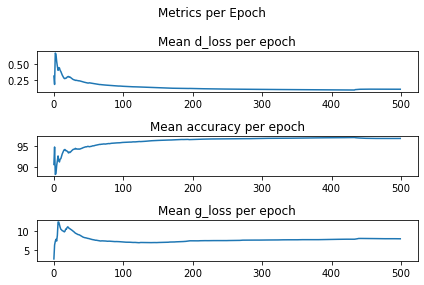

In [14]:
def train(epochs, batch_size=32, save_interval=200):
    array = []
    
    # per batch per epoch
    dloss = []
    acc = []
    gloss = []
    
    # average per epoch
    dloss_avg = []
    acc_avg = []
    gloss_avg = []
    
    #PATH OF RESIZED IMAGES
    path = "/Users/kash/Downloads/starrynight/resized_images/"
    
    for dir in os.listdir(path):
            # print(dir)
            image = Image.open(path + dir)
            data = np.asarray(image)
            array.append(data)
            
    X_train = np.array(array)
    print(X_train.shape)
    # print(X_train.shape)
    
    #Rescale data between -1 and 1
    X_train = X_train / 127.5 -1.
    bat_per_epo = int(X_train.shape[0] / batch_size)
    # X_train = np.expand_dims(X_train, axis=3)
    print(X_train.shape)
    
    #Create our Y for our Neural Networks
    valid = np.ones((batch_size, 1))
    fakes = np.zeros((batch_size, 1))
    
    for epoch in range(epochs):
        for j in range(bat_per_epo):
            #Get Random Batch
            idx = np.random.randint(0, X_train.shape[0], batch_size)
            imgs = X_train[idx]
            
            #Generate Fake Images
            noise = np.random.normal(0, 1, (batch_size, latent_dim))
            gen_imgs = generator.predict(noise)
            
            #Train discriminator
            d_loss_real = discriminator.train_on_batch(imgs, valid)
            d_loss_fake = discriminator.train_on_batch(gen_imgs, fakes)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
            noise = np.random.normal(0, 1, (batch_size, latent_dim))
            
            #inverse y label
            g_loss = GAN.train_on_batch(noise, valid)
            print("******* %d %d [D loss: %f, acc: %.2f%%] [G loss: %f]" % 
                  (epoch,j, d_loss[0], 100* d_loss[1], g_loss))
            
            # save the losses printed for plotting
            dloss.append(d_loss[0])
            acc.append(100* d_loss[1])
            gloss.append(g_loss)

        # if(epoch % save_interval) == 0)
        save_imgs(epoch)
        
        #compute the average of dloss, acc and gloss per epoch
        dloss_avg.append(np.mean(np.array(dloss)))
        gloss_avg.append(np.mean(np.array(gloss)))
        acc_avg.append(np.mean(np.array(acc)))

    # save the results for printing
    fig, (ax1, ax2, ax3) = plt.subplots(3)
    plt.suptitle('Metrics per Epoch')
    ax1.plot(dloss_avg)
    ax1.set_title('Mean d_loss per epoch')
    ax2.plot(acc_avg)
    ax2.set_title('Mean accuracy per epoch')
    ax3.plot(gloss_avg)
    ax3.set_title('Mean g_loss per epoch')
    fig.tight_layout()

train(epochs=500, batch_size=32, save_interval=200)
print('done! lets make art yay! (^*^)')

It can be seen from the graphs that the mean loss of the generator and the discriminator are going down per epoch, and the acruracy of the discriminator is still high. This may mean that the generator may still need more training to be able to generate realistic images. We should see a tug of war between the accuracy and loss of the generator and the discriminator. 

# Save the trained GAN model

The model checkpoint in keras is not as straightfoward for GANs compared to RNN and CNNs. Hence, we attempted to save both the model and the weights.

In [15]:
# SAVE THE MODEL!
generator.save('v6/gen_modelv6.h5')
discriminator.save('v6/disc_modelv6.h5')
GAN.save('v6/GANv6.h5')

# SAVE THE WEIGHTS
generator.save_weights("/Users/kash/Downloads/starrynight/v6/gen_wtsv6.h5")
discriminator.save_weights("/Users/kash/Downloads/starrynight/v6/disc_wtsv6.h5")

# Make Art from GAN!

We are interested in the generator model and we will use this to create art. The generator is fed with random noise to produce the image as an output. Below are the samples of the art that the generator was able to create.

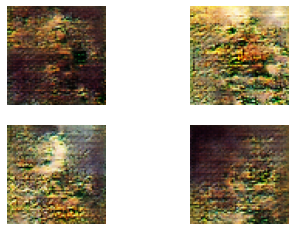

In [88]:
def make_imgs():
    r, c = 2,2
    noise = np.random.normal(0, 1, (64, latent_dim))
    gen_imgs = generator.predict(noise)

    # Rescale images 0 - 1
    gen_imgs = (gen_imgs + 1) / 2
    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i,j].imshow(gen_imgs[cnt])
            axs[i,j].axis('off')
            cnt += 1
    
    plt.show()

make_imgs()

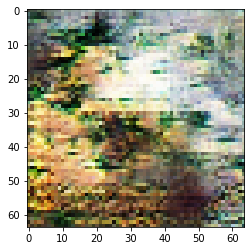

In [77]:
noise = np.random.normal(0, 1, (64, latent_dim))
gen_imgs = generator.predict(noise)
gen_imgs = (gen_imgs + 1) / 2.0
plt.imshow(gen_imgs[1])

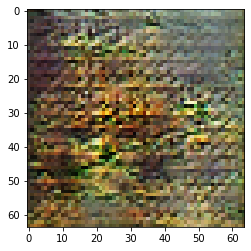

In [78]:
noise = np.random.normal(0, 1, (16, latent_dim))
gen_imgs = generator.predict(noise)
gen_imgs = (gen_imgs + 1) / 2.0
plt.imshow(gen_imgs[2])

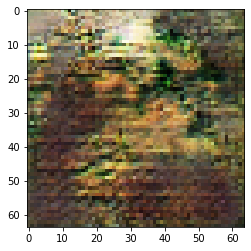

In [80]:
plt.imshow(gen_imgs[6])

It is impressive that the generator was able to make something similar to art albeit pixelated. If can also be noted that the color scheme was similar to the tone of Van Gogh's paintings. As mentioned, this model was trained for 500 epochs and took about 5 hours to train. It is not so surprising that there is no finer level of detail in the generator's output because the training set was resized to 64 x 64, and as can be seen in Section 6 this also led to lower quality images. Moreover, the training set is only 681 imanges and the epochs were only 500, with online implementations showing good results with about 50,000 images and 80,000 epochs (which my laptop cannot handle!).

**Some implementation notes**

It may be noted that we have experimented running it locally for more than 500 epochs but either the kernel dies, or we cannot save the model. Hence for this submission we stick with the more stable number of 500 epochs.

### GIF of the generated images

The GIF file of all the generated pictures were saved to be able to see the evolution of the images in each epoch. It can be seen from the gif file that the earlier epochs only had one color as the generator has not yet learned the gradients that can fool the discriminator model. As there are more training epochs, we can see much more diversity in color and can somehow see shapes forming. However, since the pixel size of the generated images is small it is a bit hard to see the details.

In [18]:
anim_file = 'v6/dcganv6.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('v6/generated_images_v6/*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

# Analysis of the Output

We are interested in the output of the generator model. It can be seen that the generated images shown above are pixelated. We may need to train the model longer and we need more computing power (this model was run using a laptop and not Jojie due to Jojie's erratic behavior that may cause training to be restarted) to produce higher quality results. Using only low resolution (i.e., 64 x 64) may also contribute to the low quality of the output. Feeding higher resolution at 128 x 128 or 256 x 256 may produce higher quality output.

It can also be seen that the generated images are somehow similar in the colors. This phenomenon is called `mode collapse` and is common in GANs. The generator wil often figure out a few images  or a single image that can fool the discriminator and can eventually collapse to produce only that image. It may be preferable to have a variety of images but GANs can collapse to only produce a single number or image regardless of the input noise. Deep Convolutional GANS (DCGANs) are better at avoiding mode collapse but we can see from the output below that we might not have succeeded thoroughly in avoiding this, despite the use of convolutional layers.

# Auxiliary - loading a saved model

In this section we tried to load the other runs of the model. This model was trained on the same training set of resized images but was saved after 300 epochs. This portion was added to display how to load a saved model. It may be noted that the load_model call can still be used, but there is a need to compile the discriminator and the generator again.

In [20]:
# try to load a model
# from keras.engine.saving import load_model
import keras

D = keras.models.load_model('v3/disc_modelv3.h5')
D.summary()

G = keras.models.load_model('v3/gen_modelv3.h5')
G.summary()

GAN_test = Sequential()
discriminator.trainable = False
GAN_test.add(G)
GAN_test.add(D)

GAN_test.compile(loss='binary_crossentropy', optimizer=adam)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 64, 64, 64)        1792      
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 64, 64, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 128)       73856     
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 64, 64, 128)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 64, 64, 128)       147584    
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 64, 64, 128)       0         
                                                                 
 conv2d_4 (Conv2D)           (None, 64, 64, 256)      

In [21]:
GAN_test.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 64, 64, 3)         2707203   
                                                                 
 sequential_1 (Sequential)   (None, 1)                 1566977   
                                                                 
Total params: 4,274,180
Trainable params: 2,707,203
Non-trainable params: 1,566,977
_________________________________________________________________


## training a loaded model

The loaded model was trained for only 50 epochs just to check the output. It is expected that the quality of the generated images is lower (more pixelated) due to the lower number of training epochs.

In [22]:
def train_fromload(epochs, batch_size=32, save_interval=200):
    array = []
    
    # per batch per epoch
    dloss = []
    acc = []
    gloss = []
    
    # average per epoch
    dloss_avg = []
    acc_avg = []
    gloss_avg = []
    
    #PUT PATH OF RESIZED IMAGES
    path = "/Users/kash/Downloads/starrynight/resized_images/"
    
    for dir in os.listdir(path):
            # print(dir)
            image = Image.open(path + dir)
            data = np.asarray(image)
            array.append(data)
            
    X_train = np.array(array)
    print(X_train.shape)
    # print(X_train.shape)
    
    #Rescale data between -1 and 1
    X_train = X_train / 127.5 -1.
    bat_per_epo = int(X_train.shape[0] / batch_size)
    # X_train = np.expand_dims(X_train, axis=3)
    print(X_train.shape)
    
    #Create our Y for our Neural Networks
    valid = np.ones((batch_size, 1))
    fakes = np.zeros((batch_size, 1))
    
    for epoch in range(epochs):
        for j in range(bat_per_epo):
            #Get Random Batch
            idx = np.random.randint(0, X_train.shape[0], batch_size)
            imgs = X_train[idx]
            
            #Generate Fake Images
            noise = np.random.normal(0, 1, (batch_size, latent_dim))
            gen_imgs = G.predict(noise)
            
            #Train discriminator
            d_loss_real = D.train_on_batch(imgs, valid)
            d_loss_fake = D.train_on_batch(gen_imgs, fakes)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
            noise = np.random.normal(0, 1, (batch_size, latent_dim))
            
            #inverse y label
            g_loss = GAN_test.train_on_batch(noise, valid)
            print("******* %d %d [D loss: %f, acc: %.2f%%] [G loss: %f]" % 
                  (epoch,j, d_loss[0], 100* d_loss[1], g_loss))
            
            # save the losses printed for plotting
            dloss.append(d_loss[0])
            acc.append(100* d_loss[1])
            gloss.append(g_loss)

            # if(epoch % save_interval) == 0)
        save_imgs(epoch)
        
        #compute the average of dloss, acc and gloss per epoch
        dloss_avg.append(np.mean(np.array(dloss)))
        gloss_avg.append(np.mean(np.array(gloss)))
        acc_avg.append(np.mean(np.array(acc)))

    # save the results for printing
#     fig, (ax1, ax2, ax3) = plt.subplots(3)
#     plt.suptitle('Metrics per Epoch')
#     ax1.plot(dloss_avg)
#     ax1.set_title('Mean d_loss per epoch')
#     ax2.plot(acc_avg)
#     ax2.set_title('Mean accuracy per epoch')
#     ax3.plot(gloss_avg)
#     ax3.set_title('Mean g_loss per epoch')
#     fig.tight_layout()

train_fromload(epochs=50, batch_size=32, save_interval=200)
print('done! lets make art ^_^')

(680, 64, 64, 3)
(680, 64, 64, 3)


2022-02-25 03:34:20.775432: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-02-25 03:34:20.934046: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-02-25 03:34:21.371810: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


******* 0 0 [D loss: 0.040960, acc: 96.88%] [G loss: 8.592896]
******* 0 1 [D loss: 0.089756, acc: 95.31%] [G loss: 5.124155]
******* 0 2 [D loss: 1.260732, acc: 70.31%] [G loss: 1.486044]
******* 0 3 [D loss: 4.280292, acc: 51.56%] [G loss: 0.050974]
******* 0 4 [D loss: 7.546195, acc: 50.00%] [G loss: 0.004759]
******* 0 5 [D loss: 12.428411, acc: 50.00%] [G loss: 0.000000]
******* 0 6 [D loss: 16.410492, acc: 50.00%] [G loss: 0.000002]
******* 0 7 [D loss: 20.872731, acc: 50.00%] [G loss: 0.000000]
******* 0 8 [D loss: 24.083262, acc: 48.44%] [G loss: 0.000000]
******* 0 9 [D loss: 26.758477, acc: 50.00%] [G loss: 0.000000]
******* 0 10 [D loss: 31.821082, acc: 50.00%] [G loss: 0.000000]
******* 0 11 [D loss: 29.336956, acc: 50.00%] [G loss: 0.000000]
******* 0 12 [D loss: 33.180335, acc: 48.44%] [G loss: 0.000000]
******* 0 13 [D loss: 36.585903, acc: 50.00%] [G loss: 0.000000]
******* 0 14 [D loss: 36.316643, acc: 50.00%] [G loss: 0.000000]
******* 0 15 [D loss: 40.083647, acc: 48

******* 6 2 [D loss: 55.250141, acc: 50.00%] [G loss: 0.000000]
******* 6 3 [D loss: 51.785242, acc: 50.00%] [G loss: 0.000000]
******* 6 4 [D loss: 51.413305, acc: 50.00%] [G loss: 0.000000]
******* 6 5 [D loss: 51.956108, acc: 50.00%] [G loss: 0.000000]
******* 6 6 [D loss: 53.742389, acc: 50.00%] [G loss: 0.000000]
******* 6 7 [D loss: 52.016288, acc: 48.44%] [G loss: 0.000000]
******* 6 8 [D loss: 58.803262, acc: 50.00%] [G loss: 0.000000]
******* 6 9 [D loss: 56.350952, acc: 50.00%] [G loss: 0.000000]
******* 6 10 [D loss: 55.517641, acc: 50.00%] [G loss: 0.000000]
******* 6 11 [D loss: 57.776304, acc: 48.44%] [G loss: 0.000000]
******* 6 12 [D loss: 50.786266, acc: 48.44%] [G loss: 0.000000]
******* 6 13 [D loss: 53.527874, acc: 48.44%] [G loss: 0.000000]
******* 6 14 [D loss: 54.858150, acc: 48.44%] [G loss: 0.000000]
******* 6 15 [D loss: 55.538668, acc: 50.00%] [G loss: 0.000000]
******* 6 16 [D loss: 52.238655, acc: 50.00%] [G loss: 0.000000]
******* 6 17 [D loss: 55.231223, 

******* 12 3 [D loss: 50.196746, acc: 48.44%] [G loss: 0.000000]
******* 12 4 [D loss: 55.213583, acc: 50.00%] [G loss: 0.000000]
******* 12 5 [D loss: 49.957457, acc: 46.88%] [G loss: 0.000000]
******* 12 6 [D loss: 54.850895, acc: 50.00%] [G loss: 0.000000]
******* 12 7 [D loss: 56.724207, acc: 48.44%] [G loss: 0.000000]
******* 12 8 [D loss: 55.550034, acc: 46.88%] [G loss: 0.000000]
******* 12 9 [D loss: 55.860376, acc: 50.00%] [G loss: 0.000000]
******* 12 10 [D loss: 54.468405, acc: 50.00%] [G loss: 0.000000]
******* 12 11 [D loss: 52.437744, acc: 50.00%] [G loss: 0.000000]
******* 12 12 [D loss: 55.329570, acc: 50.00%] [G loss: 0.000000]
******* 12 13 [D loss: 55.993311, acc: 48.44%] [G loss: 0.000000]
******* 12 14 [D loss: 53.272834, acc: 50.00%] [G loss: 0.000000]
******* 12 15 [D loss: 47.504992, acc: 50.00%] [G loss: 0.000000]
******* 12 16 [D loss: 55.120564, acc: 50.00%] [G loss: 0.000000]
******* 12 17 [D loss: 55.528774, acc: 50.00%] [G loss: 0.000000]
******* 12 18 [D 

******* 18 3 [D loss: 52.917323, acc: 50.00%] [G loss: 0.000000]
******* 18 4 [D loss: 54.239483, acc: 48.44%] [G loss: 0.000000]
******* 18 5 [D loss: 54.770101, acc: 48.44%] [G loss: 0.000000]
******* 18 6 [D loss: 54.490238, acc: 50.00%] [G loss: 0.000000]
******* 18 7 [D loss: 53.926657, acc: 48.44%] [G loss: 0.000000]
******* 18 8 [D loss: 53.788273, acc: 50.00%] [G loss: 0.000000]
******* 18 9 [D loss: 54.421349, acc: 50.00%] [G loss: 0.000000]
******* 18 10 [D loss: 55.752643, acc: 50.00%] [G loss: 0.000000]
******* 18 11 [D loss: 57.464625, acc: 50.00%] [G loss: 0.000000]
******* 18 12 [D loss: 56.208282, acc: 50.00%] [G loss: 0.000000]
******* 18 13 [D loss: 52.974707, acc: 48.44%] [G loss: 0.000000]
******* 18 14 [D loss: 55.757128, acc: 50.00%] [G loss: 0.000000]
******* 18 15 [D loss: 58.972386, acc: 48.44%] [G loss: 0.000000]
******* 18 16 [D loss: 52.126620, acc: 50.00%] [G loss: 0.000000]
******* 18 17 [D loss: 52.950855, acc: 48.44%] [G loss: 0.000000]
******* 18 18 [D 

******* 24 3 [D loss: 58.944761, acc: 48.44%] [G loss: 0.000000]
******* 24 4 [D loss: 53.589659, acc: 50.00%] [G loss: 0.000000]
******* 24 5 [D loss: 54.464088, acc: 50.00%] [G loss: 0.000000]
******* 24 6 [D loss: 56.446841, acc: 50.00%] [G loss: 0.000000]
******* 24 7 [D loss: 51.512633, acc: 48.44%] [G loss: 0.000000]
******* 24 8 [D loss: 53.957953, acc: 46.88%] [G loss: 0.000000]
******* 24 9 [D loss: 54.634980, acc: 50.00%] [G loss: 0.000000]
******* 24 10 [D loss: 51.123152, acc: 50.00%] [G loss: 0.000000]
******* 24 11 [D loss: 54.970164, acc: 50.00%] [G loss: 0.000000]
******* 24 12 [D loss: 55.956637, acc: 50.00%] [G loss: 0.000000]
******* 24 13 [D loss: 55.900218, acc: 50.00%] [G loss: 0.000000]
******* 24 14 [D loss: 54.058625, acc: 50.00%] [G loss: 0.000000]
******* 24 15 [D loss: 55.750513, acc: 50.00%] [G loss: 0.000000]
******* 24 16 [D loss: 58.141198, acc: 50.00%] [G loss: 0.000000]
******* 24 17 [D loss: 54.821700, acc: 48.44%] [G loss: 0.000000]
******* 24 18 [D 

******* 30 3 [D loss: 50.780232, acc: 48.44%] [G loss: 0.000000]
******* 30 4 [D loss: 57.644159, acc: 48.44%] [G loss: 0.000000]
******* 30 5 [D loss: 56.418951, acc: 50.00%] [G loss: 0.000000]
******* 30 6 [D loss: 53.729766, acc: 50.00%] [G loss: 0.000000]
******* 30 7 [D loss: 53.609334, acc: 50.00%] [G loss: 0.000000]
******* 30 8 [D loss: 56.393621, acc: 48.44%] [G loss: 0.000000]
******* 30 9 [D loss: 56.660012, acc: 48.44%] [G loss: 0.000000]
******* 30 10 [D loss: 54.319767, acc: 50.00%] [G loss: 0.000000]
******* 30 11 [D loss: 53.863275, acc: 50.00%] [G loss: 0.000000]
******* 30 12 [D loss: 52.895524, acc: 50.00%] [G loss: 0.000000]
******* 30 13 [D loss: 52.276252, acc: 50.00%] [G loss: 0.000000]
******* 30 14 [D loss: 50.554213, acc: 50.00%] [G loss: 0.000000]
******* 30 15 [D loss: 52.450074, acc: 48.44%] [G loss: 0.000000]
******* 30 16 [D loss: 58.228596, acc: 50.00%] [G loss: 0.000000]
******* 30 17 [D loss: 54.453089, acc: 50.00%] [G loss: 0.000000]
******* 30 18 [D 

******* 36 3 [D loss: 56.562814, acc: 50.00%] [G loss: 0.000000]
******* 36 4 [D loss: 52.819784, acc: 50.00%] [G loss: 0.000000]
******* 36 5 [D loss: 57.683955, acc: 50.00%] [G loss: 0.000000]
******* 36 6 [D loss: 55.816826, acc: 48.44%] [G loss: 0.000000]
******* 36 7 [D loss: 54.242385, acc: 50.00%] [G loss: 0.000000]
******* 36 8 [D loss: 54.350744, acc: 50.00%] [G loss: 0.000000]
******* 36 9 [D loss: 53.130708, acc: 50.00%] [G loss: 0.000000]
******* 36 10 [D loss: 53.466844, acc: 50.00%] [G loss: 0.000000]
******* 36 11 [D loss: 54.981297, acc: 50.00%] [G loss: 0.000000]
******* 36 12 [D loss: 55.822074, acc: 50.00%] [G loss: 0.000000]
******* 36 13 [D loss: 55.304697, acc: 50.00%] [G loss: 0.000000]
******* 36 14 [D loss: 54.773873, acc: 50.00%] [G loss: 0.000000]
******* 36 15 [D loss: 55.790339, acc: 50.00%] [G loss: 0.000000]
******* 36 16 [D loss: 54.700422, acc: 50.00%] [G loss: 0.000000]
******* 36 17 [D loss: 52.873969, acc: 50.00%] [G loss: 0.000000]
******* 36 18 [D 

******* 42 3 [D loss: 56.256301, acc: 48.44%] [G loss: 0.000000]
******* 42 4 [D loss: 51.359042, acc: 50.00%] [G loss: 0.000000]
******* 42 5 [D loss: 56.990792, acc: 50.00%] [G loss: 0.000000]
******* 42 6 [D loss: 54.445177, acc: 50.00%] [G loss: 0.000000]
******* 42 7 [D loss: 56.157861, acc: 50.00%] [G loss: 0.000000]
******* 42 8 [D loss: 56.160390, acc: 50.00%] [G loss: 0.000000]
******* 42 9 [D loss: 52.786720, acc: 50.00%] [G loss: 0.000000]
******* 42 10 [D loss: 54.224953, acc: 50.00%] [G loss: 0.000000]
******* 42 11 [D loss: 56.398990, acc: 48.44%] [G loss: 0.000000]
******* 42 12 [D loss: 53.975456, acc: 50.00%] [G loss: 0.000000]
******* 42 13 [D loss: 56.743230, acc: 50.00%] [G loss: 0.000000]
******* 42 14 [D loss: 55.151682, acc: 50.00%] [G loss: 0.000000]
******* 42 15 [D loss: 55.055674, acc: 50.00%] [G loss: 0.000000]
******* 42 16 [D loss: 56.926010, acc: 46.88%] [G loss: 0.000000]
******* 42 17 [D loss: 57.374729, acc: 50.00%] [G loss: 0.000000]
******* 42 18 [D 

******* 48 3 [D loss: 55.263327, acc: 48.44%] [G loss: 0.000000]
******* 48 4 [D loss: 55.896221, acc: 50.00%] [G loss: 0.000000]
******* 48 5 [D loss: 55.948014, acc: 50.00%] [G loss: 0.000000]
******* 48 6 [D loss: 59.369126, acc: 50.00%] [G loss: 0.000000]
******* 48 7 [D loss: 57.417834, acc: 50.00%] [G loss: 0.000000]
******* 48 8 [D loss: 58.140973, acc: 50.00%] [G loss: 0.000000]
******* 48 9 [D loss: 52.104710, acc: 50.00%] [G loss: 0.000000]
******* 48 10 [D loss: 52.012509, acc: 50.00%] [G loss: 0.000000]
******* 48 11 [D loss: 53.590115, acc: 50.00%] [G loss: 0.000000]
******* 48 12 [D loss: 56.306462, acc: 50.00%] [G loss: 0.000000]
******* 48 13 [D loss: 53.082526, acc: 50.00%] [G loss: 0.000000]
******* 48 14 [D loss: 56.445911, acc: 46.88%] [G loss: 0.000000]
******* 48 15 [D loss: 52.908593, acc: 50.00%] [G loss: 0.000000]
******* 48 16 [D loss: 56.654255, acc: 50.00%] [G loss: 0.000000]
******* 48 17 [D loss: 53.732793, acc: 48.44%] [G loss: 0.000000]
******* 48 18 [D 

## Art from loaded model

Indeed, the generated images from the loaded model are of lower quality and more pixelated. We can also see that the same colors are generated, only placed differently.

2022-02-25 03:48:50.013593: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


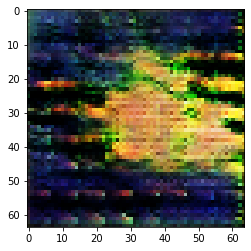

In [23]:
noise = np.random.normal(0, 1, (16, latent_dim))
gen_imgs = G.predict(noise)
gen_imgs = (gen_imgs + 1) / 2.0
plt.imshow(gen_imgs[2])

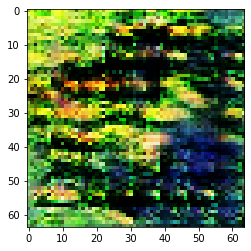

In [24]:
plt.imshow(gen_imgs[6])

## Other experiments done

It may be noted that in doing this study, we also tried using another training set composed of other paintings where the predominant features are faces and using different art styles (eg drawings, renaissance portraits, surrealist portraits). The same GAN architecture was used and trained on 1,000 portrait paintings for 2,000 epochs. The painting styles on this training set was more diverse so we are also expecting that the results may show some diversity. Training time was 23 hours but unfortunately the model was not saved since the notebook became unresponsive.

A sample of the training set for this dataset is shown below. The paintings followed the same preprocessing (resizing to 64 x 64).

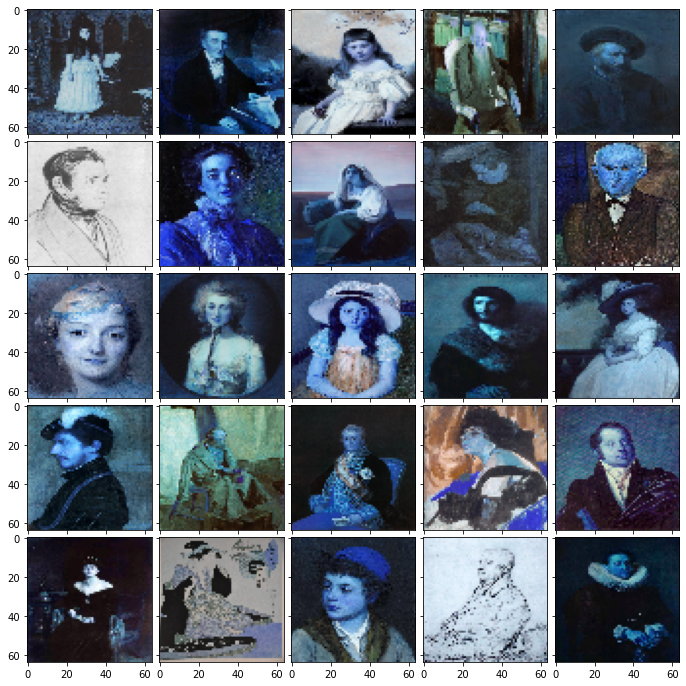

In [4]:
from mpl_toolkits.axes_grid1 import ImageGrid

rows = 5
cols = 5
img_arr = []

for r in range(679,710):
    path3 = '/Users/kash/Downloads/starrynight/resized_paintings1k/'
    trainpics = cv2.imread(path3 + str(r)+'.png')
    img = np.asarray(trainpics)
    img_arr.append(img)

fig = plt.figure(figsize=(12,12))
grid = ImageGrid(fig, 111, # this is the rect that will set ax position
                 nrows_ncols=(rows, cols),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes
                 )

for ax, im in zip(grid, img_arr):
    ax.imshow(im)

plt.show()

The following gif shows the evolution of the images generated by the generator.  it can be seen that as the epochs progressed there seems to be some blurry faces that is being produced. The longer training time and more samples seemed to produce better results as some blurry face shapes can be seen in the later epochs.

# Conclusions

**So, can AI make art?** From the results of this project, the answer is a `qualified yes`! This study was able to show how a GAN can be trained to produce paintings. However, this study can still be improved. The issues that were found were as follows:

***1. Training resources***

GANs are very resource intensive because they require processing of images. GPUs are required for a more reasonable training time. Due to limitations in the computational power available and the time it takes to run the models, hyperparameter tuning and architecture finetuning was also very limited.


***2. Mode collapse***

The variety of images that the generator can produce is not very diverse. GANs can suffer from mode collapse, wherein the generator learns a few images or a single image that can fool a discriminator. 


***3. Instability***

It can be difficult to ascertain performance and appropriate training epochs since the generated images are always truly fake. Moreover, the model design of the GAN is that it is built on two competing models, leading to oscillation between performance of the two models. 

***4. GANS are hard to train***
My implementation was relatively simple and introductory so I could get a gentle introduction to GANS. However, I was not able to get nicer results and the generated artwork will not sell in an auction - but  the knowledge I gained in this experience is priceless!

# Recommendations

This study will benefit from relaxing the limitations in this study. The following can be explored:

***1. More computational resources and longer training time could be alloted***

It was seen from the model using 1,000 paintings as input and trained for 2,000 epochs that the results were visually better, although still pixelated. Resizing the input to a bigger size like 128x128 or 256x256 could be explored, and this would need higher computing power.

***2. Explore bigger datasets from various artists and different painting styles.***

Scraping wikiart could be done to get a more diverse set of painting samples, which could feed more painting styles and different subjects to the model. This may output a more interesting art generation, and we can surmise that the output may be similar to abstract art.

***3. Explore other architectures such as DCGAN, WGAN***

There are many advancements in GANs in recent years. We can stand in the shoulder of the giants and try their implementation to see how the results of using this training set can be improved. We can explore DCGAN where batch normalization is used and explore implementations that try to address mode collapse such as WGAN. 

***4. Tuning the hyperparameters and the model architecture***

The hyperparameter tuning and the architecture tuning was done using a combination of trial and error and research on the paths well treaded before. There could be a more systematic way to explore the hypertuning of the model parameters.

***5. Implement the model using Pytorch***

This model was implemented in tensorflow using the keras API. Pytorch can be explored if this will lead to a more efficient implementation.

# References

Alon, Y. 2021. Machine-made art using Generative Adversarial Networks. https://towardsdatascience.com/machine-made-art-using-generative-adversarial-networks-35faa41a4feb

Brownlee, J. 2019. A Gentle Introduction to Generative Adversarial Networks (GANs).
https://machinelearningmastery.com/what-are-generative-adversarial-networks-gans/

Brownlee, J. 2020. How to Code the GAN Training Algorithm and Loss Functions.
https://machinelearningmastery.com/how-to-code-the-generative-adversarial-network-training-algorithm-and-loss-functions/

Google. Generative Adversarial Networks. https://developers.google.com/machine-learning/gan

Khandelwal, R. 2019. Generative Adversarial Network (GAN) using Keras. https://medium.datadriveninvestor.com/generative-adversarial-network-gan-using-keras-ce1c05cfdfd3

Marin, I., Gotovac, S. Russo, M. and Bozic-Stulic, D. 2021. The Effect of Latent Space Dimension on the Quality of Synthesized Human Face Images. https://www.researchgate.net/publication/351832396_The_Effect_of_Latent_Space_Dimension_on_the_Quality_of_Synthesized_Human_Face_Images

Nandi, S. 2021. “ARTGAN” — A Simple Generative Adversarial Networks Based On Art Images Using DeepLearning & Pytorch. https://medium.com/analytics-vidhya/artgan-a-b77ecb1bc25a

Portilla, J. 2020. Complete Guide to TensorFlow for Deep Learning with Python. https://www.udemy.com/course/complete-guide-to-tensorflow-for-deep-learning-with-python/

Pytorch. DCGAN Tutorial. https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

Shresta, A. 2019. Generating Modern Art using
Generative Adversarial Network(GAN) on Spell. https://towardsdatascience.com/generating-modern-arts-using-generative-adversarial-network-gan-on-spell-39f67f83c7b4

Google Developers. Loss Functions. https://developers.google.com/machine-learning/gan/loss